In [703]:
import sys
import os
import pandas as pd
from ema_workbench.analysis.parcoords import ParallelAxes, get_limits
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 5]
sys.path.append('..')
import numpy as np
import random
from sklearn.preprocessing import MinMaxScaler #to rescale Euclidean mean
from itertools import chain
from platypus import Solution, Problem

import problem_formulation_original, problem_formulation_gini, problem_formulation_euclidean

# Loading solutions (only objectives)

## Make a dictionary out of all solutions

In [704]:
pareto_sets = {}

ethical_formulations = ['TraditionalPrinciple',
                        'CombinedTraditionalGiniMean', 
                        'CombinedTraditionalGiniStd',
                        'CombinedTraditionalGiniRatioStdMean',
                        'CombinedTraditionalEuclideanMean',
                        'CombinedTraditionalEuclideanStd',
                        'CombinedTraditionalEuclideanRatioStdMean',
]

# Call refsets if already saved

In [705]:
folder_destination_data = '/Users/farleyrimon/Documents/GitHub/MUSEH2O/susquehanna/refsets' 
folder_destination = '/Users/farleyrimon/Documents/GitHub/MUSEH2O/susquehanna/refsets' 

reference_sets = {}
for entry in ethical_formulations:
    reference_sets[entry] = pd.read_csv(os.path.join(f'{folder_destination_data}', f"{entry}_refset_with_variables.csv"))


In [706]:
import pickle

# open a file, where you stored the pickled data
file_all_ineq = open(f'{folder_destination_data}/dict_principles_all_inequality_metrics.pkl', 'rb')
file_obj = open(f'{folder_destination_data}/dict_principles_objectives.pkl', 'rb')

# dump information to that file
dict_principles_all_inequality_metrics = pickle.load(file_all_ineq)
dict_principles_objectives = pickle.load(file_obj)


# close the file
file_all_ineq.close()
file_obj.close()


In [707]:
def column_renamer_reference_set(df):
    new_columns = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation', 'Equity']
    # Get the current column names
    current_columns = df.columns

    # Create a mapping dictionary to map old column names to new column names
    mapping = dict(zip(current_columns[-7:], new_columns))

    # Rename the columns using the mapping dictionary
    df = df.rename(columns=mapping)
    obj_columns = df.columns[-7:]
    df[obj_columns] = df[obj_columns].apply(pd.to_numeric, errors='coerce')
    return df


for i in range(7):
    reference_sets[ethical_formulations[i]] = column_renamer_reference_set(reference_sets[ethical_formulations[i]])

In [708]:
df_traditional_log = dict_principles_all_inequality_metrics[ethical_formulations[0]]
df_gini_std_log = dict_principles_all_inequality_metrics[ethical_formulations[2]]
df_gini_mean_log = dict_principles_all_inequality_metrics[ethical_formulations[1]]
df_eucli_std_log = dict_principles_all_inequality_metrics[ethical_formulations[5]]
df_gini_ratio_log = dict_principles_all_inequality_metrics[ethical_formulations[3]]
df_eucli_mean_log = dict_principles_all_inequality_metrics[ethical_formulations[4]]
df_eucli_ratio_log = dict_principles_all_inequality_metrics[ethical_formulations[6]]


In [709]:
def column_renamer(df, ethical_formulation, formulation_number):
    df = df.copy()
    new_columns = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation', 'Gini Mean', 'Euclidean Mean', 'Gini Std', 'Euclidean Std', 'Gini Ratio', 'Euclidean Ratio', 'Formulation']
    df = df.drop('Equity', axis=1)
    df['principle'] = df['principle'].replace(ethical_formulation, formulation_number)
    df.columns = new_columns
    return df

j = 1
for i in range(7):
    dict_principles_all_inequality_metrics[ethical_formulations[i]] = column_renamer(dict_principles_all_inequality_metrics[ethical_formulations[i]],ethical_formulations[i],f'F{j}')
    j += 1


# Statistical and validation tests

## Analysis on j hydro reliability 

The conversion of j_hydro to revenue included an important assumption. We are testing to see if the reliability surpassess 1 which should theoretically not be allowed. Moreover, if the reliability never approaches 1, it would be an indication that the threshold to calculate the reliability is too high as well.

In [710]:
# print(df_gini_std_log['j_hydro_reliability_yearly_mean'].max())
# print(df_gini_mean_log['j_hydro_reliability_yearly_mean'].max())
# print(df_eucli_std_log['j_hydro_reliability_yearly_mean'].max())
# print(df_gini_ratio_log['j_hydro_reliability_yearly_mean'].max())
# print(df_eucli_mean_log['j_hydro_reliability_yearly_mean'].max())
# print(df_eucli_ratio_log['j_hydro_reliability_yearly_mean'].max())
# print(df_traditional_log['j_hydro_reliability_yearly_mean'].max())



We can confirm that the assumption is reasonable as a reliability close to 1 can be achieved without surpassing the threshold of 1.

## Kruskall Wallis Test

The Kruskal-Wallis H test (sometimes also called the "one-way ANOVA on ranks") is a rank-based nonparametric test that can be used to determine if there are statistically significant differences between two or more groups of an independent variable on a continuous variable. 


We will use the Kruskall Wallis test to determine if:

- The distribution of two formulations are by no chance random when compared to each other (Mann-Whitney U test)
- The distribution between objectives of the difference formulation are by no chance random when compared

In [711]:
from scipy import stats
df_traditional = pd.DataFrame(reference_sets[ethical_formulations[0]].iloc[:,-7:])
df_traditional.name = 'F1'
df_gini_mean = pd.DataFrame(reference_sets[ethical_formulations[1]].iloc[:,-7:])
df_gini_mean.name = 'F2'
df_gini_std = pd.DataFrame(reference_sets[ethical_formulations[2]].iloc[:,-7:])
df_gini_std.name = 'F3'
df_gini_ratio = pd.DataFrame(reference_sets[ethical_formulations[3]].iloc[:,-7:])
df_gini_ratio.name = 'F4'
df_eucli_mean = pd.DataFrame(reference_sets[ethical_formulations[4]].iloc[:,-7:])
df_eucli_mean.name = 'F5'
df_eucli_std = pd.DataFrame(reference_sets[ethical_formulations[5]].iloc[:,-7:])
df_eucli_std.name = 'F6'
df_eucli_ratio = pd.DataFrame(reference_sets[ethical_formulations[6]].iloc[:,-7:])
df_eucli_ratio.name = 'F7'

list_df = [df_gini_mean,df_gini_std,df_gini_ratio,df_eucli_mean, df_eucli_std,df_eucli_ratio]

We can reject the null hypothesis where the distribution of objectives and is dependent on the distribution of the distributive justice value. Their distribution is different such that the statistical significance of this hypothesis is true (p<0.05).

In [712]:
for df in list_df:
    print(f"\nFormulation: {df.name}")
    p_values_col = []

    for col in df.columns:
        y = df[col]
        x = df['Equity']
        h, p_value = stats.kruskal(x, y)
        print(f"Column {col}: H-statistic={h:.2f}, p-value={p_value:.4f}")
        


Formulation: F2
Column Hydropower revenue: H-statistic=519.75, p-value=0.0000
Column Atomic PP: H-statistic=485.11, p-value=0.0000
Column Baltimore: H-statistic=350.84, p-value=0.0000
Column Chester: H-statistic=515.32, p-value=0.0000
Column Environment: H-statistic=517.51, p-value=0.0000
Column Recreation: H-statistic=567.53, p-value=0.0000
Column Equity: H-statistic=0.00, p-value=1.0000

Formulation: F3
Column Hydropower revenue: H-statistic=383.25, p-value=0.0000
Column Atomic PP: H-statistic=383.25, p-value=0.0000
Column Baltimore: H-statistic=383.25, p-value=0.0000
Column Chester: H-statistic=383.25, p-value=0.0000
Column Environment: H-statistic=383.25, p-value=0.0000
Column Recreation: H-statistic=423.73, p-value=0.0000
Column Equity: H-statistic=0.00, p-value=1.0000

Formulation: F4
Column Hydropower revenue: H-statistic=567.75, p-value=0.0000
Column Atomic PP: H-statistic=563.14, p-value=0.0000
Column Baltimore: H-statistic=555.75, p-value=0.0000
Column Chester: H-statistic=5


Formulation: F2

Formulation: F3

Formulation: F4

Formulation: F5

Formulation: F6

Formulation: F7


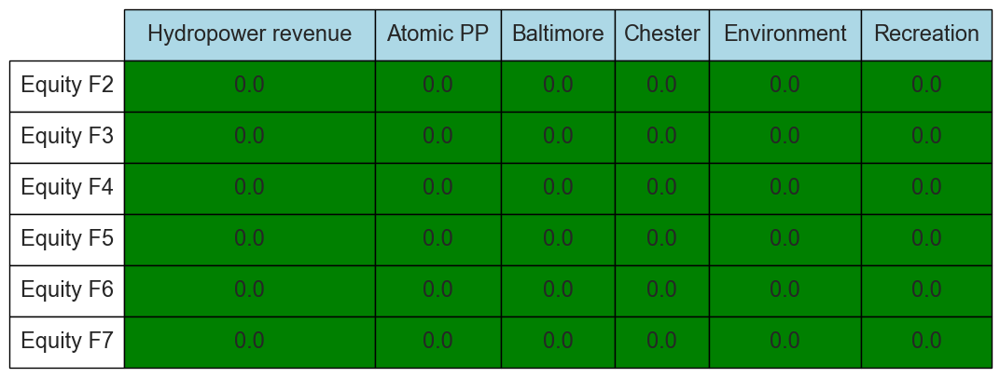

In [713]:

# Define the desired column names
column_names = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation',]
# Create a table to store p-values
p_values_table = pd.DataFrame(columns=column_names)

formulations_number = [f'F{i}' for i in range(2,8)]

j = 0

for df in list_df:
    print(f"\nFormulation: {df.name}")
    
    # Create a row index based on the dataframe name
    row_index = f'Equity {formulations_number[j]}'
    j+=1

    # Create a row to store p-values for the equity column
    p_values_row = []
    
    
    # Iterate over each column
    for col in column_names:
        y = df[col]
        x = df['Equity']
        h, p_value = stats.kruskal(x, y)
        
        # Append p-value to the row
        p_values_row.append(p_value)
    
    # Add the p-values row to the table
    p_values_table.loc[row_index] = p_values_row

# Create a colormap for coloring the cells
cmap = plt.cm.get_cmap('RdYlGn')

# Create a figure and axis for the table
fig, ax = plt.subplots()
ax.axis('off')

# Plot the table
table = ax.table(cellText=p_values_table.values.round(4),
                 colLabels=p_values_table.columns,
                 rowLabels=p_values_table.index,
                 cellColours=np.where(p_values_table < 0.05, 'green', 'red'),
                 colColours=['lightblue'] * len(p_values_table.columns),
                 cellLoc='center',  # Align cell text to the center
                 bbox=[0, 0, 1, 1])

# Adjust the font size and cell padding
table.set_fontsize(17)
table.scale(1, 1.5)
table.auto_set_column_width([0] + list(range(1, len(column_names) + 1)))  # Adjust column width

# Show the plot
plt.show()

## Mann-Whitney U test

The Mann-Whitney U test is a nonparametric test that does not assume any particular distribution for the data. Instead of comparing means, it compares the distributions of the two groups by ranking all of the observations and comparing the sum of the ranks in each group. The Mann-Whitney U test is more appropriate for data that is not normally distributed or when the variances of the two groups are unequal. It is also more robust to outliers than the t-test.

In [714]:
from scipy.stats import mannwhitneyu


In [715]:

df_traditional = pd.DataFrame(reference_sets[ethical_formulations[0]].iloc[:,-7:-2])
df_traditional.name = ethical_formulations[0]
df_gini_mean = pd.DataFrame(reference_sets[ethical_formulations[1]].iloc[:,-7:-2])
df_gini_mean.name = ethical_formulations[1]
df_gini_std = pd.DataFrame(reference_sets[ethical_formulations[2]].iloc[:,-7:-2])
df_gini_std.name = ethical_formulations[2]
df_gini_ratio = pd.DataFrame(reference_sets[ethical_formulations[3]].iloc[:,-7:-2])
df_gini_ratio.name = ethical_formulations[3]
df_eucli_mean = pd.DataFrame(reference_sets[ethical_formulations[4]].iloc[:,-7:-2])
df_eucli_mean.name = ethical_formulations[4]
df_eucli_std = pd.DataFrame(reference_sets[ethical_formulations[5]].iloc[:,-7:-2])
df_eucli_std.name = ethical_formulations[5]
df_eucli_ratio = pd.DataFrame(reference_sets[ethical_formulations[6]].iloc[:,-7:-2])
df_eucli_ratio.name = ethical_formulations[6]

list_df = [df_traditional, df_gini_mean,df_gini_std,df_gini_ratio,df_eucli_mean, df_eucli_std,df_eucli_ratio]

### Mann Whitney U test for all shared columns

In [716]:
for i in range(len(list_df)):
    for j in range(i+1, len(list_df)):
        print(f"\nComparing dataframes {list_df[i].name} and {list_df[j].name}")
        
        # Get the column names that are in both dataframes
        shared_cols = set(list_df[i].columns) & set(list_df[j].columns)
        
        # Loop over all pairs of columns in the two dataframes
        for col in shared_cols:
            u, p = mannwhitneyu(list_df[i][col], list_df[j][col], alternative='two-sided')
            print(f"Column {col}: U-statistic={u:.2f}, p-value={p:.7f}")
            


Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniMean
Column Hydropower revenue: U-statistic=35180.00, p-value=0.4955513
Column Chester: U-statistic=33132.00, p-value=0.0728003
Column Atomic PP: U-statistic=40730.00, p-value=0.0196490
Column Baltimore: U-statistic=34714.00, p-value=0.3499634
Column Environment: U-statistic=33660.00, p-value=0.1317479

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniStd
Column Hydropower revenue: U-statistic=23477.00, p-value=0.0186556
Column Chester: U-statistic=30190.00, p-value=0.0221348
Column Atomic PP: U-statistic=31966.00, p-value=0.0004383
Column Baltimore: U-statistic=27423.00, p-value=0.7076149
Column Environment: U-statistic=23084.00, p-value=0.0086892

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniRatioStdMean
Column Hydropower revenue: U-statistic=37702.00, p-value=0.2901497
Column Chester: U-statistic=46599.00, p-value=0.0005833
Column Atomic PP: U-statistic=46738.00, p-value

In [717]:
import pandas as pd

# Create a dictionary to store the comparison results
results = {'Formulation 1': [], 'Formulation 2': [], 'Objective': [], 'p-value': []}

# Loop over the comparison results and store the relevant information in the dictionary
for i in range(len(list_df)):
    for j in range(i+1, len(list_df)):
        df1_name = list_df[i].name
        df2_name = list_df[j].name
        shared_cols = set(list_df[i].columns) & set(list_df[j].columns)
        for col in shared_cols:
            u, p = mannwhitneyu(list_df[i][col], list_df[j][col], alternative='two-sided')
            results['Formulation 1'].append(df1_name)
            results['Formulation 2'].append(df2_name)
            results['Objective'].append(col)
            results['p-value'].append(p)

# Create a DataFrame from the results dictionary
results_df = pd.DataFrame(results)

# Create a function to apply custom styling
def highlight_pvalue(p):
    color = 'red' if p > 0.05 else 'green'
    return f'color: {color}'

# Apply the custom styling to the p-value column
highlighted_df = results_df.style.applymap(highlight_pvalue, subset=['p-value'])

# Render the styled DataFrame as HTML
styled_html = highlighted_df.render()

# Save the HTML to a file
with open("Mann_Whitney_across_formulations_same_objective.html", "w") as file:
    file.write(styled_html)
    
# Display the highlighted DataFrame
highlighted_df



/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/617578193.py:31: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  styled_html = highlighted_df.render()


,Formulation 1,Formulation 2,Objective,p-value
0,TraditionalPrinciple,CombinedTraditionalGiniMean,Hydropower revenue,0.495551
1,TraditionalPrinciple,CombinedTraditionalGiniMean,Chester,0.072800
2,TraditionalPrinciple,CombinedTraditionalGiniMean,Atomic PP,0.019649
3,TraditionalPrinciple,CombinedTraditionalGiniMean,Baltimore,0.349963
4,TraditionalPrinciple,CombinedTraditionalGiniMean,Environment,0.131748
5,TraditionalPrinciple,CombinedTraditionalGiniStd,Hydropower revenue,0.018656
6,TraditionalPrinciple,CombinedTraditionalGiniStd,Chester,0.022135
7,TraditionalPrinciple,CombinedTraditionalGiniStd,Atomic PP,0.000438
8,TraditionalPrinciple,CombinedTraditionalGiniStd,Baltimore,0.707615
9,TraditionalPrinciple,CombinedTraditionalGiniStd,Environment,0.008689


There is statistical significance in the difference between the distribution of objectives across different formulations when the p-value exceeds 0.05. In that case, we say that the Null Hypothesis is False. The Null Hypothesis refers to the assumption that the distribution across objectives is different because of randomness, and not because of the formulation itself. The p-value < 0.05 (95% confidence that the Null Hypothesis is False). 

The distribution for the atomic power plant shows that the p-value exceeds 0.05 between several of the formulations. Between the traditional formulation and formulations with distributive justice, the p-value will always exceed 0.05 for the atomic power plant. Subsequently, the trade-off for the atomic power plant objective will not be unique to the formulation observed. 

The p-value between the Traditional Formulation and the Gini Mean will exceed 0.05 as well for the Hydropower revenue, Chester, Baltimore, and the Environment. Only for the Euclidean Mean the p-value does not exceed 0.05 for any objective. For the other formulations, the distribution of objectives is similar across formulations.  We can confirm that the trade-off that rises from optimizing the traditional formulation and optimizing the traditional formulation with a complementing justice formulation will be distincitive, because for other objectives the null hypothesis can be rejected (p-value < 0.05), meaning the distribution across the same objectives have statistical significance in the way they are distributed. The exception here is for the Gini Mean where the p-value of several distributions are above 0.05. The Gini Mean will lead to similar trade-offs across objective as the Traditional Formulation.

Interestingly, while the Gini formulations have a high p-value when comparing this objective across different aggregation methods over time, for the Euclidean formulation this is not the case. Hence, the Gini, regardless of the aggregation method over time seems to provide solutions with the same trade-off for the atomic power plant objective.

When the distribution is compared across inequality metrics, with the same aggregation method formulation, we notice that the standard deviation formulations (i.e. standard deviation, and ratio between standard deviation and mean) will yield a higher p-value, meaning their distribution is significantly similar for several of the objectives. A reason for this could be the fact that we made the assumption of duplicating the yearly mean value across every month. This made the distribution across months less significant, and the solutions identified more dependent on the same information as the yearly mean. In the end, we can conclude that the p-value exceeding 0.05 across inequality metrics, indicates that the aggregation method over time has a stronger influence on the distribution rising from the optimization.

We notice as well some outliers such as the p-value for four objectives (hydropower, baltimore, atomic, recreation) between the Gini Mean formulation and Euclidean Std exceeding 0.05. The same happens between the Gini Std formulation and the Euclidean Std (three p-values exceeding 0.05), and Euclidean Ratio (five p-values exceeding 0.05). The trade-off across solutions will thus be similar for these objectives. An explanation to this is that the epsilon values for the search of nondominated solutions is very large. This is because we wanted to find global optima, and not all solutions, which yields many local optima solutions. This leads to global optima solutions across formulations being very similar, while a smaller epsilon value will indicate, as expected, that there is no similarity in the distribution from objectives across formulations.


Nevertheless, most objectives satisfy a difference in distribution across formulation. These results are expected, having for some of the objectives similarities across formulations is expected since out of the seven objectives, one objective has been changed throughout formulations. When the optimization algorithm is working, it is still finding similar solutions that satisfy the other six objectives. It can be concluded that the Pareto front, relative to six other efficiency objectives, is not sensitive to the change from implementing solely one distributive justice objective .

**For other objectives, there is always a p-value < 0.05 between formulations over inequality metric, and over aggregation method**

### Mann-Whitney U test for all pairwise combinations of columns

Luckily, the distribution between objectives from different formulations are different such that the null hypothesis can be rejected for most objectives. Only between the Mean (aggregation over time) formulations  we observe that the distributions of the atomic plant objective and the chester objective are not random, hence the distribution of objective values for both objectives will be similar when it is compared across Mean formulations. This means that such formulations will share the same shift in Pareto frontFor other objectives, there is a statistical difference between the distribution of objectives. This means, that when we compare the distribution of objectives (as will be done in the boxplot analysis) the Pareto front is shifting differently across the formulations, regardless of the objective formulation, inequality metrics, or aggregation method over time.

Nonetheless, since the p-value is low for other objectives, we cannot determine how the Pareto front is shifting due to different formulations. That is why we decide to visually plot the solutions to gain a better understanding for the other objectives. We now understand the general role of inequality metrics, and the role of aggregation over time for the balitmore reliability, chester reliability, and (for some of the formulations) for the atomic plant reliability.

In [718]:
import itertools

# Loop over all pairs of dataframes
for i in range(len(list_df)):
    print(i)
    for j in range(i+1, len(list_df)):
        print(f"\nComparing dataframes {list_df[i].name} and {list_df[j].name}")
        
        # Get the column names that are in both dataframes
        shared_cols = set(list_df[i].columns) & set(list_df[j].columns)
        
        # Loop over all pairwise combinations of shared columns
        for col1, col2 in itertools.combinations(shared_cols, 2):
            u, p = mannwhitneyu(list_df[i][col1], list_df[j][col2], alternative='two-sided')
            print(f"Columns {col1} and {col2}: U-statistic={u:.2f}, p-value={p:.7f}")

0

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniMean
Columns Hydropower revenue and Chester: U-statistic=72870.00, p-value=0.0000000
Columns Hydropower revenue and Atomic PP: U-statistic=72870.00, p-value=0.0000000
Columns Hydropower revenue and Baltimore: U-statistic=72870.00, p-value=0.0000000
Columns Hydropower revenue and Environment: U-statistic=72870.00, p-value=0.0000000
Columns Chester and Atomic PP: U-statistic=31205.00, p-value=0.0044983
Columns Chester and Baltimore: U-statistic=52874.00, p-value=0.0000000
Columns Chester and Environment: U-statistic=72845.00, p-value=0.0000000
Columns Atomic PP and Baltimore: U-statistic=59786.00, p-value=0.0000000
Columns Atomic PP and Environment: U-statistic=72559.00, p-value=0.0000000
Columns Baltimore and Environment: U-statistic=71420.00, p-value=0.0000000

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniStd
Columns Hydropower revenue and Chester: U-statistic=53760.00, p-value=0.0000000
Col

In [719]:
# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=["Formulation 1", "Formulation 2", "Objective 1", "Objective 2", "p-value"])

# Loop over all pairs of dataframes
for i in range(len(list_df)-1):
    for j in range(i+1, len(list_df)):
        print(f"\nComparing dataframes {list_df[i].name} and {list_df[j].name}")
        
        # Get the column names that are in both dataframes
        shared_cols = set(list_df[i].columns) & set(list_df[j].columns)
        
        # Loop over all pairwise combinations of shared columns
        for col1, col2 in itertools.combinations(shared_cols, 2):
            u, p = mannwhitneyu(list_df[i][col1], list_df[j][col2], alternative='two-sided')            
            # Add the results to the DataFrame
            results_df = results_df.append({
                "Formulation 1": list_df[i].name,
                "Formulation 2": list_df[j].name,
                "Objective 1": col1,
                "Objective 2": col2,
                "p-value": p
            }, ignore_index=True)
            



Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniMean

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniStd

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniRatioStdMean

Comparing dataframes TraditionalPrinciple and CombinedTraditionalEuclideanMean

Comparing dataframes TraditionalPrinciple and CombinedTraditionalEuclideanStd

Comparing dataframes TraditionalPrinciple and CombinedTraditionalEuclideanRatioStdMean

Comparing dataframes CombinedTraditionalGiniMean and CombinedTraditionalGiniStd

Comparing dataframes CombinedTraditionalGiniMean and CombinedTraditionalGiniRatioStdMean

Comparing dataframes CombinedTraditionalGiniMean and CombinedTraditionalEuclideanMean

Comparing dataframes CombinedTraditionalGiniMean and CombinedTraditionalEuclideanStd

Comparing dataframes CombinedTraditionalGiniMean and CombinedTraditionalEuclideanRatioStdMean

Comparing dataframes CombinedTraditionalGiniStd and CombinedTraditionalGiniRatioS

/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({
/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({
/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({
/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({



Comparing dataframes CombinedTraditionalGiniStd and CombinedTraditionalEuclideanStd

Comparing dataframes CombinedTraditionalGiniStd and CombinedTraditionalEuclideanRatioStdMean

Comparing dataframes CombinedTraditionalGiniRatioStdMean and CombinedTraditionalEuclideanMean

Comparing dataframes CombinedTraditionalGiniRatioStdMean and CombinedTraditionalEuclideanStd

Comparing dataframes CombinedTraditionalGiniRatioStdMean and CombinedTraditionalEuclideanRatioStdMean

Comparing dataframes CombinedTraditionalEuclideanMean and CombinedTraditionalEuclideanStd

Comparing dataframes CombinedTraditionalEuclideanMean and CombinedTraditionalEuclideanRatioStdMean

Comparing dataframes CombinedTraditionalEuclideanStd and CombinedTraditionalEuclideanRatioStdMean


/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({
/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({
/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({
/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/3661150390.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


In [720]:
results_df = results_df.style.applymap(highlight_pvalue, subset=['p-value'])

# Render the styled DataFrame as HTML
styled_html = highlighted_df.render()

# Save the HTML to a file
with open("Mann_Whitney_across_formulations_across_objectives.html", "w") as file:
    file.write(styled_html)
    
results_df


/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_9286/698091639.py:4: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  styled_html = highlighted_df.render()


,Formulation 1,Formulation 2,Objective 1,Objective 2,p-value
0,TraditionalPrinciple,CombinedTraditionalGiniMean,Hydropower revenue,Chester,0.000000
1,TraditionalPrinciple,CombinedTraditionalGiniMean,Hydropower revenue,Atomic PP,0.000000
2,TraditionalPrinciple,CombinedTraditionalGiniMean,Hydropower revenue,Baltimore,0.000000
3,TraditionalPrinciple,CombinedTraditionalGiniMean,Hydropower revenue,Environment,0.000000
4,TraditionalPrinciple,CombinedTraditionalGiniMean,Chester,Atomic PP,0.004498
5,TraditionalPrinciple,CombinedTraditionalGiniMean,Chester,Baltimore,0.000000
6,TraditionalPrinciple,CombinedTraditionalGiniMean,Chester,Environment,0.000000
7,TraditionalPrinciple,CombinedTraditionalGiniMean,Atomic PP,Baltimore,0.000000
8,TraditionalPrinciple,CombinedTraditionalGiniMean,Atomic PP,Environment,0.000000
9,TraditionalPrinciple,CombinedTraditionalGiniMean,Baltimore,Environment,0.000000


# Visualizations

## Pairplots

We cannot observe a fixed pattern across objectives. Hence, there is no trade-off to analyze here.

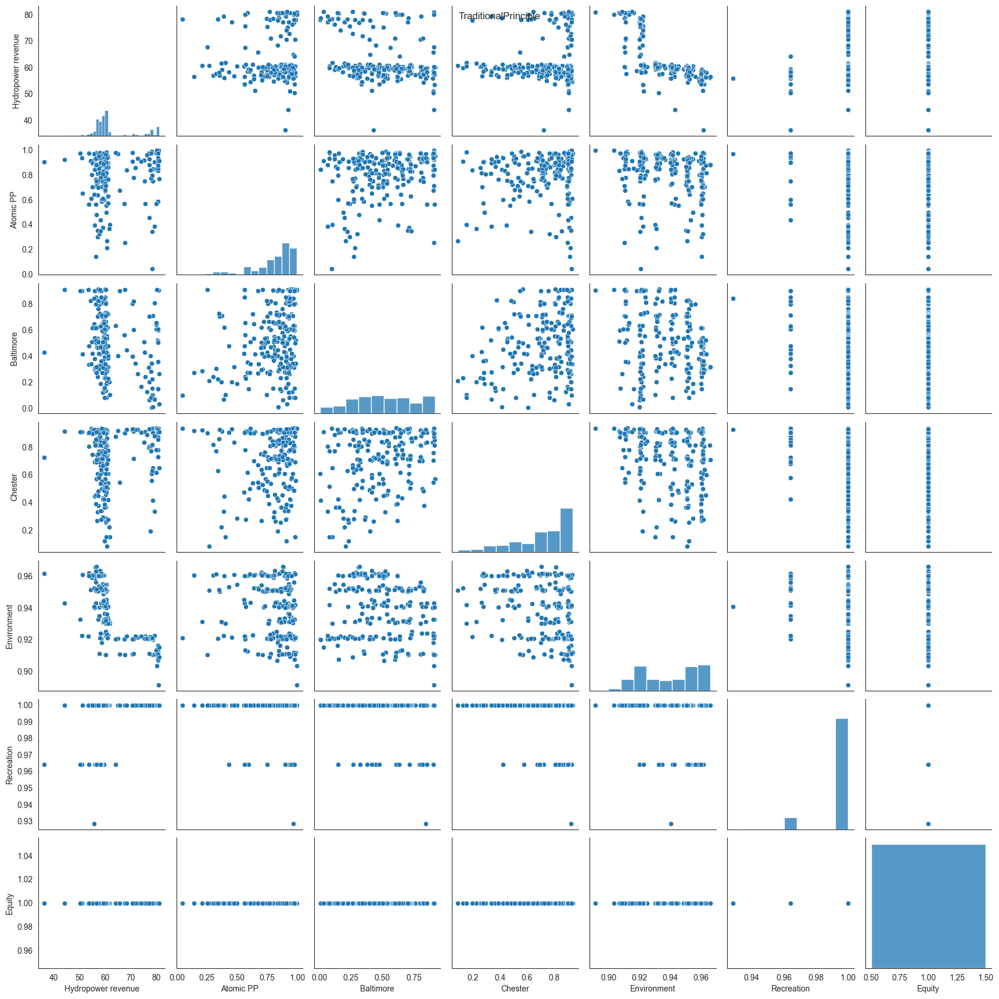

<Figure size 1700x500 with 0 Axes>

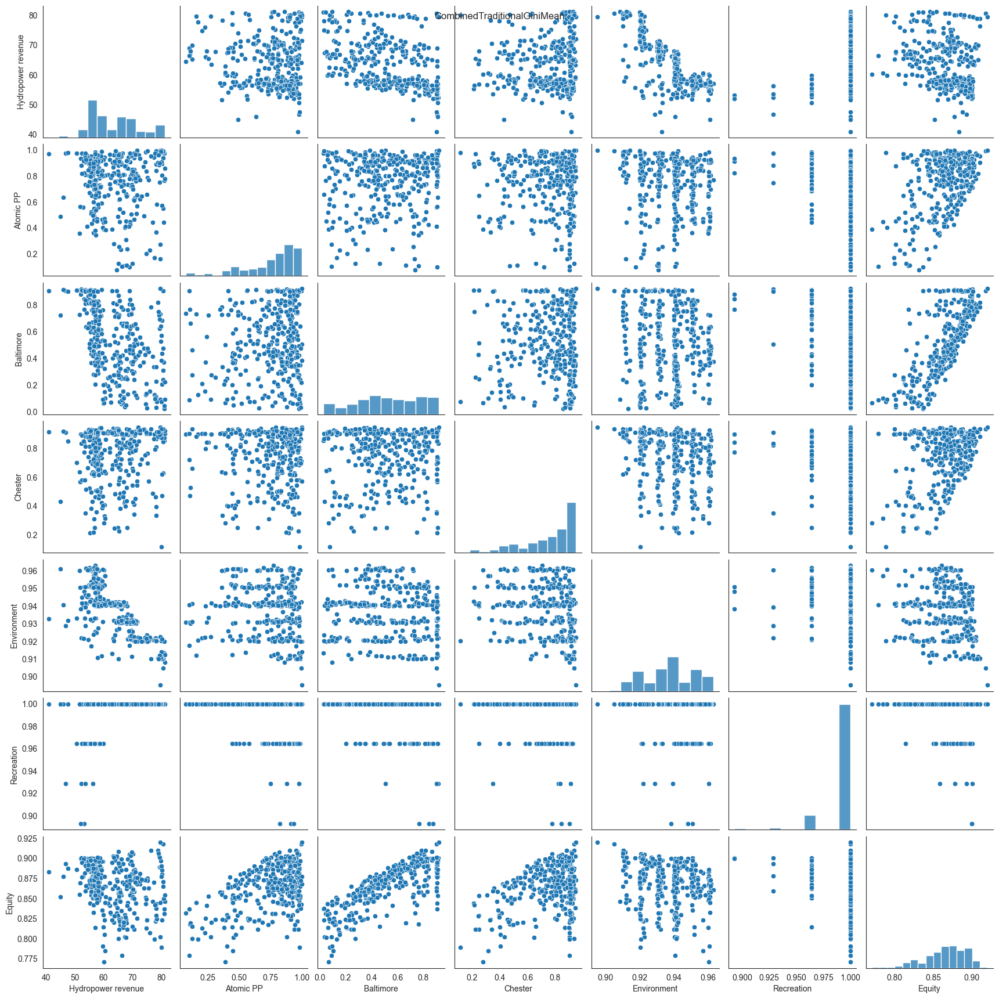

<Figure size 1700x500 with 0 Axes>

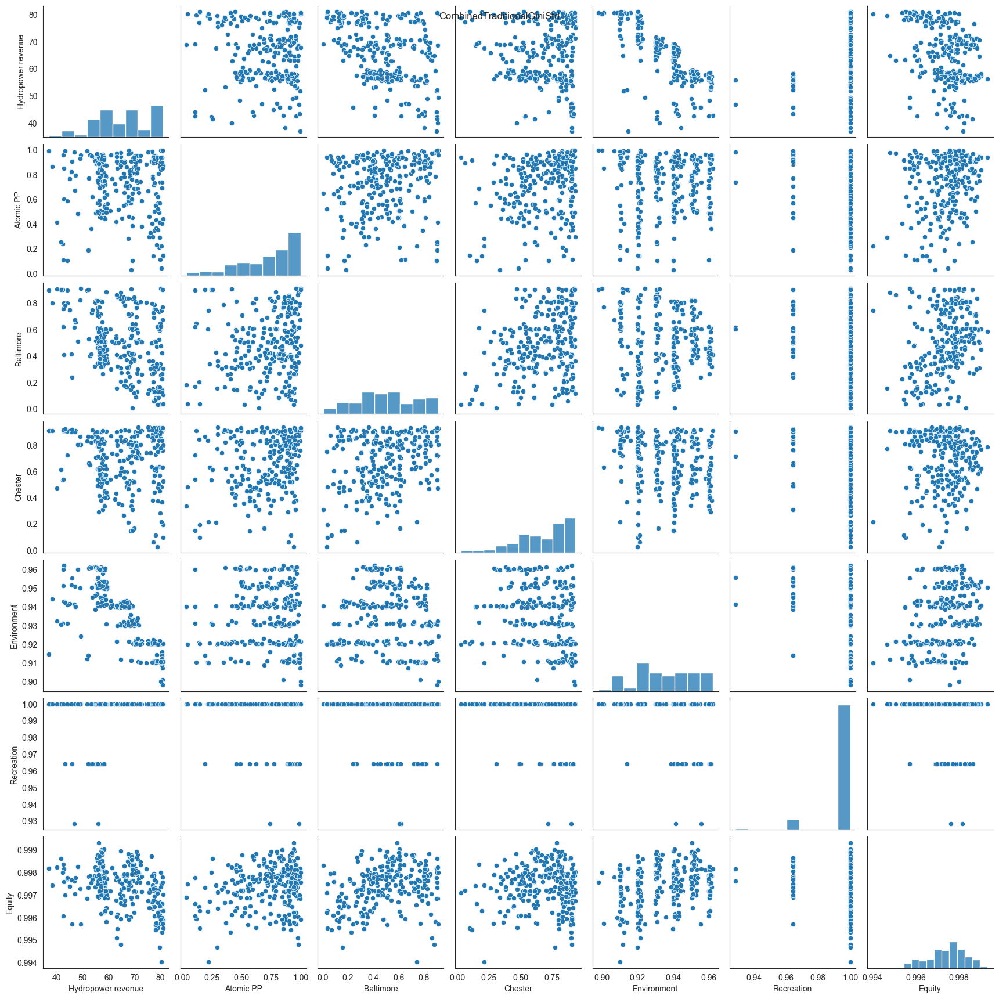

<Figure size 1700x500 with 0 Axes>

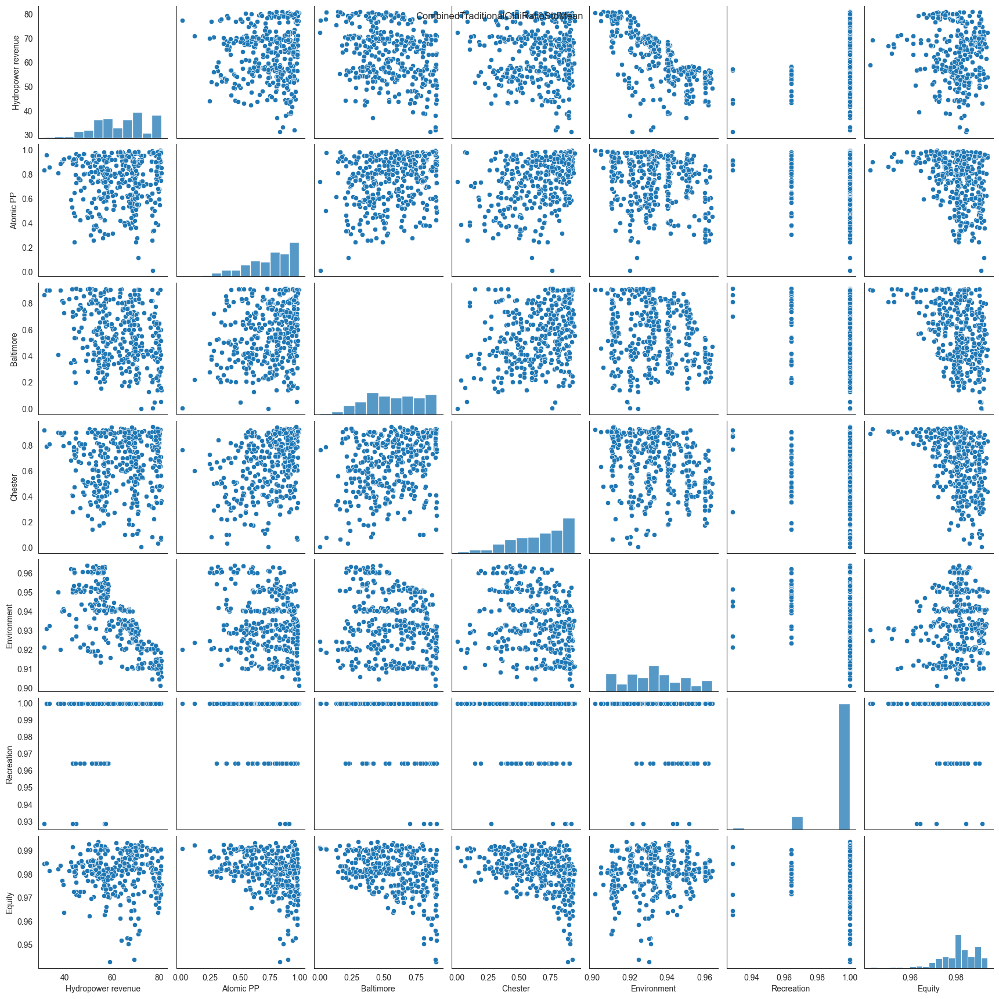

<Figure size 1700x500 with 0 Axes>

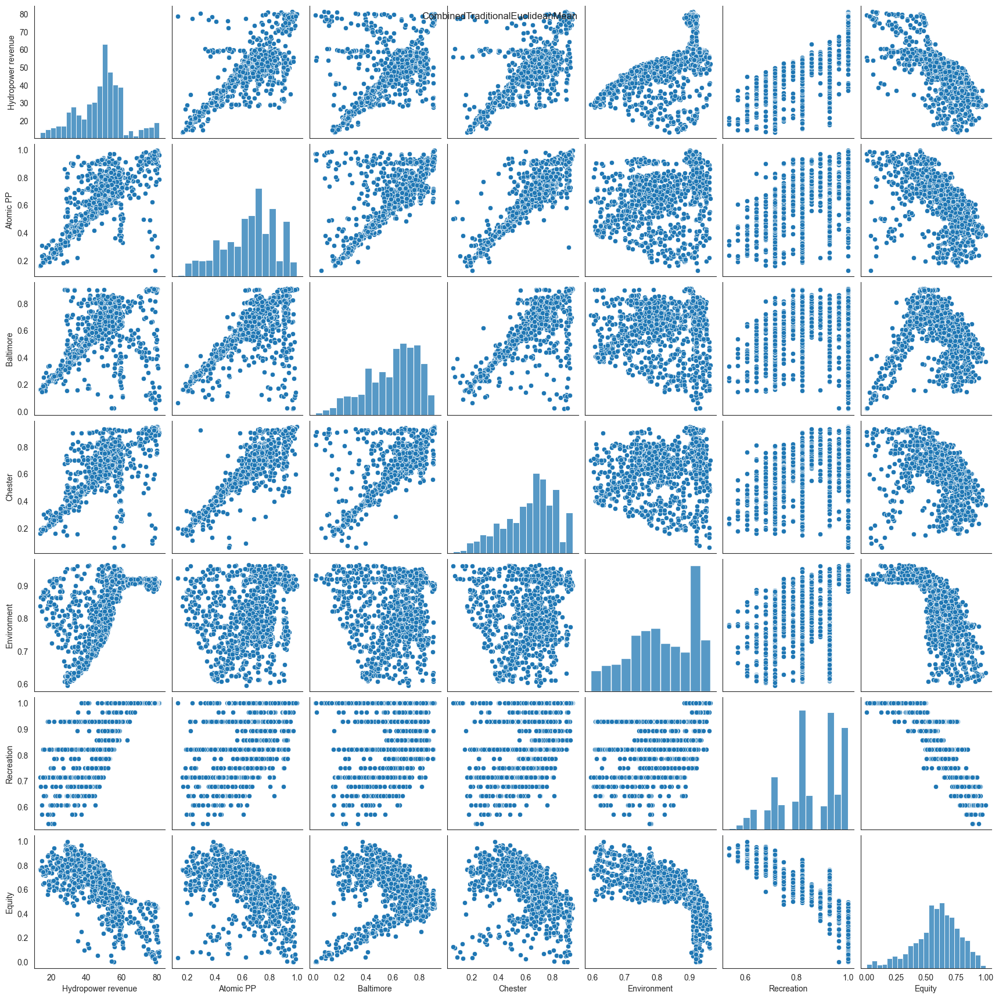

<Figure size 1700x500 with 0 Axes>

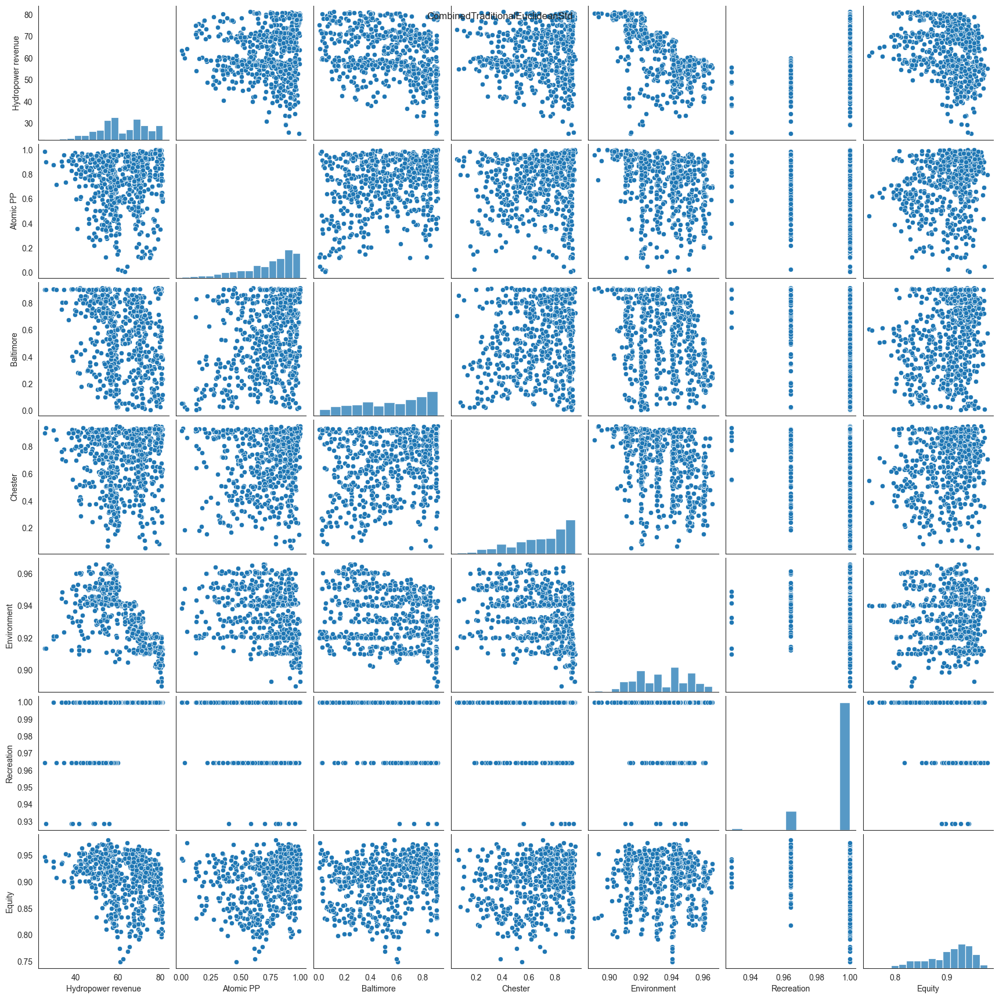

<Figure size 1700x500 with 0 Axes>

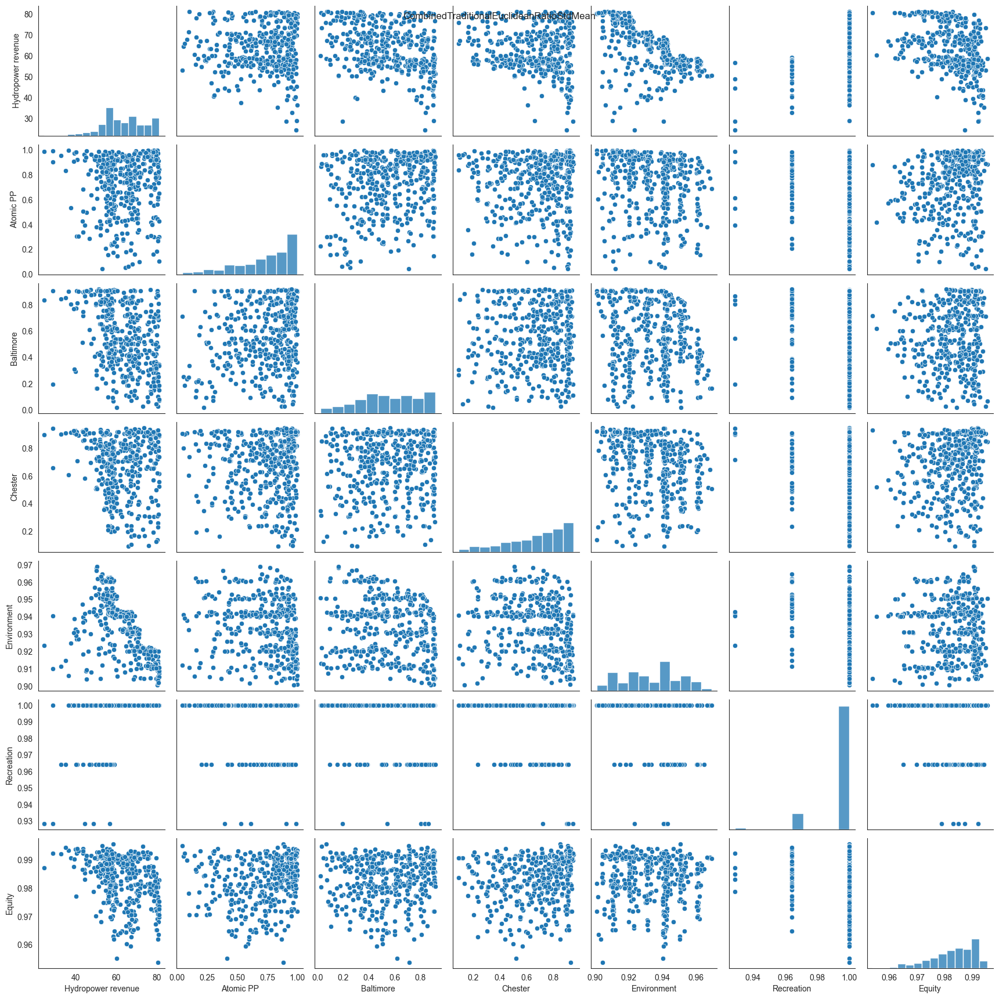

<Figure size 1700x500 with 0 Axes>

In [500]:
# for the different principles except traditional

for i in dict_principles_objectives:
    g = sns.pairplot(dict_principles_objectives[i], kind = 'scatter')
    g.fig.suptitle(i)
    plt.show()
    plt.savefig(f'figs/{k}_all_pairplot.png')


## Scatter plot: Trends for each objective

It does not show much relevance as the points are scattered everywhere for each objective, so we removed this visualization.

## Parallel Axis Plot: Trade-off analysis


### Min, Max, Median of each formulation

In [721]:
def get_median(df, median_column, threshold):
    
    median = df[median_column].median()

    # calculate the absolute difference between each value in column x and the median
    diff = abs(df[median_column] - median)
    df_diff = pd.DataFrame(diff)
    df_diff = df_diff.sort_values(by = median_column, ascending = True)
    
    # get the index of the row with the smallest absolute difference
    df_diff_indexes = df_diff.iloc[:threshold,:].index
    df_final = df.iloc[df_diff_indexes,:]

    return df_final

def get_max(df, max_column, threshold):   
    max_value = df[max_column].max()

    # calculate the absolute difference between each value in column x and the median
    diff = abs(df[max_column] - max_value)
    df_diff = pd.DataFrame(diff)
    df_diff = df_diff.sort_values(by = max_column, ascending = True)
    
    # get the index of the row with the smallest absolute difference
    df_diff_indexes = df_diff.iloc[:threshold,:].index
    df_final = df.iloc[df_diff_indexes,:]

    return df_final

def get_min(df, min_column, threshold):
    min_value = df[min_column].min()

    # calculate the absolute difference between each value in column x and the median
    diff = abs(df[min_column] - min_value)
    df_diff = pd.DataFrame(diff)
    
    df_diff = df_diff.sort_values(by = min_column, ascending = True)
    
    # get the index of the row with the smallest absolute difference
    df_diff_indexes = df_diff.iloc[:threshold,:].index
    df_final = df.iloc[df_diff_indexes,:]

    return df_final

Before continuing we must normalize the euclidean mean so it falls within the same range as other equity objectives


In [722]:
# from sklearn.preprocessing import MinMaxScaler

# # Access the dataframe corresponding to the key
# dataframe = dict_principles_objectives[ethical_formulations[4]]

# # Select the 'Equity' column
# equity_column = dataframe['Equity']

# # Reshape the column to a 2D array for normalization
# equity_values = equity_column.values.reshape(-1, 1)

# # Initialize the MinMaxScaler
# scaler = MinMaxScaler()

# # Normalize the column between 0 and 1
# normalized_equity = scaler.fit_transform(equity_values)

# # Update the 'Equity' column with the normalized values
# dataframe['Equity'] = normalized_equity

In [723]:
dict_principles_all_inequality_metrics[ethical_formulations[0]]

,Hydropower revenue,Atomic PP,Baltimore,Chester,Environment,Recreation,Gini Mean,Euclidean Mean,Gini Std,Euclidean Std,Gini Ratio,Euclidean Ratio,Formulation
0,78.046700,0.841303,0.004994,0.607341,0.920103,1.0,0.187017,7.813253,0.002570,0.102453,0.013740,0.013113,F1
1,80.557980,0.976265,0.599020,0.870355,0.907357,1.0,0.106604,5.775801,0.002264,0.113902,0.021239,0.019721,F1
2,78.536841,0.747754,0.102683,0.649202,0.920592,1.0,0.171253,7.271524,0.001839,0.120445,0.010736,0.016564,F1
3,78.615720,0.841699,0.009515,0.415491,0.920020,1.0,0.202022,8.006161,0.002850,0.153706,0.014106,0.019198,F1
4,77.007220,0.974322,0.314006,0.796706,0.920657,1.0,0.136552,6.730654,0.002706,0.076665,0.019818,0.011390,F1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,59.034555,0.608906,0.510419,0.901862,0.943415,1.0,0.131639,6.008162,0.002311,0.093206,0.017555,0.015513,F1
206,80.597665,0.874878,0.504140,0.728862,0.910664,1.0,0.122445,6.148101,0.003208,0.202492,0.026202,0.032936,F1
207,81.054324,0.768799,0.262326,0.648852,0.908892,1.0,0.151738,6.849920,0.004173,0.222539,0.027500,0.032488,F1
208,59.249454,0.891306,0.432619,0.905096,0.944260,1.0,0.130883,6.302188,0.003284,0.100036,0.025093,0.015873,F1


In [724]:
from sklearn.preprocessing import MinMaxScaler

# Access the dataframe corresponding to the key
dataframe = dict_principles_all_inequality_metrics[ethical_formulations[0]]

# Select the 'Equity' column
equity_column = dataframe['Euclidean Mean']
# equity_column_2 = dataframe['eucli_mean']


# Reshape the column to a 2D array for normalization
equity_values = equity_column.values.reshape(-1, 1)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Normalize the column between 0 and 1
normalized_equity = scaler.fit_transform(equity_values)

# Update the 'Equity' column with the normalized values
dataframe['Euclidean Mean'] = normalized_equity

In [725]:
dict_principles_all_inequality_metrics_trade_off_vis = {}

def column_renamer_plotter_converter(df):
    new_columns = ['Gini Mean', 'Eucli Mean', 'Gini Std', 'Eucli Std', 'Gini Ratio', 'Eucli Ratio']
    # Get the current column names
    current_columns = df.columns

    # Create a mapping dictionary to map old column names to new column names
    mapping = dict(zip(current_columns[-7:], new_columns))

    # Rename the columns using the mapping dictionary
    df = df.rename(columns=mapping)
    equity_columns = df.columns[-7:]
    df[equity_columns] = df[equity_columns].apply(pd.to_numeric, errors='coerce')

    df[equity_columns] = 1 - df[equity_columns]
#     df = df.drop('Equity', axis=1)
    return df

dict_principles_all_inequality_metrics_trade_off_vis[ethical_formulations[0]] = column_renamer_plotter_converter(dict_principles_all_inequality_metrics[ethical_formulations[0]])

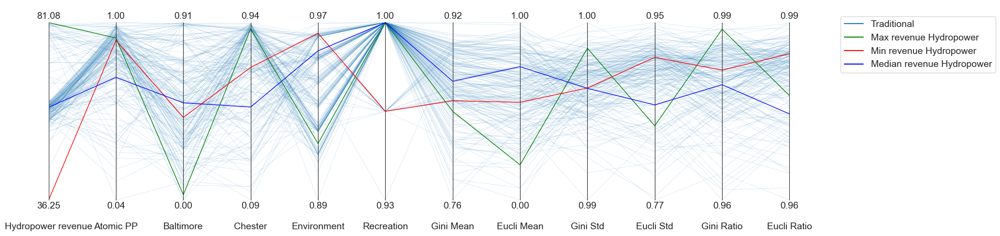

In [765]:
plt.rcParams['figure.figsize'] = [17, 5]

ethical_formulations_experiment_name = ['Traditional', 'Gini Mean', 'Gini Deviation', 'Gini Ratio', 'Euclidean Mean', 'Euclidean Deviation', 'Euclidean Ratio',]

for (k,v), c in zip(dict_principles_all_inequality_metrics_trade_off_vis.items(), sns.color_palette()):
    df_principle = pd.DataFrame(dict_principles_all_inequality_metrics_trade_off_vis[k].iloc[:,:-1])

    if k == ethical_formulations[0]:
        df_max = get_max(df_principle, 'Hydropower revenue',1)
        df_min = get_min(df_principle, 'Hydropower revenue',1)
        df_median = get_median(df_principle, 'Hydropower revenue',1)
        limits = get_limits(df_principle)
        axes = ParallelAxes(limits, rot=0)    
        axes.plot(v, label=ethical_formulations_experiment_name[0], color=c, lw = 0.2, alpha=0.5)
        axes.plot(df_max, label='Max revenue Hydropower', lw=1, color='green', alpha=1)
        axes.plot(df_min, label='Min revenue Hydropower', lw=1, color='red', alpha=1)
        axes.plot(df_median, label='Median revenue Hydropower', lw=1, color='blue', alpha=1)
        axes.legend()
        plt.savefig(f'figs/{k}_all_solutions_and_max_median_min_solutions_Parallel_Plot.png', dpi=300, bbox_inches='tight')
        

Before I set off with this analysis, one should be aware that the Axes has been reversed for the Environment, and the Justice formulations to indicate the direction of preference. Hence, while these objectives aim to be minimized in the optimization, to visually represent them, the optimized value has been subtracted from 1, thus representing the value as if it were desired to be maximized, just like the other objectives, with a preference to lie on the upper range of values. Because I am looking for solutions where distributive justice is apparent, the solutions ideally represent a horizontal behaviour. This means that the objectives are equally satisfied. In this research I defined the equal satisfaction of objectives as something that is desired for distributive justice. This aligns to the egalitarian ethical principle previously defined as the starting point for the notion of distributive justice. Hence, an ideal behaviour would represent a horizontal line across objectives. Unideal behaviour would represent large diagonal lines across objectives, which represents that while a certain objective gains high objective values, the other objective gains a low objective value, i.e. not an equally (horizontally) satisfied objective.


When I look at all the solutions, I see that there is not a fixed pattern in what trade-offs are made, since the solution space spans over the entire objective space. However, across this solution space, I can identify patterns that indicate where most solutions will tend to, namely solutions will yield for the hydropower revenue a value between 36.25 M and 81.08 M, with most solutions yielding approximately 60 M. For some solutions this will lead to a strong trade-off between high values for the Atomic PP, Recreation, Environment, and Chester and low values for Baltimore. For example, one trade-off for the solution is when the Hydropower Revenue is around 60 M, Atomic PP close to 100\%, Baltimore close to 0\%, Chester close to 94\%, the Environment around 90\%, and the Recreation around 100\%. Hence, objectives will be close to satisfactory values at the expense of the insatisfaction of the Hydropower Revenue objective, and the Baltimore objective, with Baltimore being the least satisfied. In such case, having a complementing distributive justice formulation makes sure solutions with such large relative differences across objectives are not brought into the solution space. Nonetheless, there are solutions with a less strong trade-off between the Hydropower revenue, the Atomic PP, and Baltimore however, at the cost of lower values for Chester. Additionally, there are also solutions with a strong opposite trade-off between Chester and Baltimore, where Chester will have low values, but the Atomic PP and Baltimore reaches higher values. Finally, there is also a small subset of solutions, that produces no trade-off between objectives, and ensure high objective values for each objective. Of course, it is impossible to have more water available to achieve both highest efficiency and highest justice at the same time, meaning that the water going to The frequency of such solutions is very low, for which it is almost not apparent in the trade-offs. \

An explanation to the lower values for Baltimore is because the demand of Baltimore is the highest across the six objectives. Hence, the reliability, which makes use of this demand as a reference value to calculate the reliability value leads to the same water allocation across objectives, representing large differences in the reliability objective obtained. It is important to keep this in mind before assuming that values closer to 0 for Baltimore indicate none of water is allocated to Baltimore, which as explained, is not the case.

Due to the controversy around the Hydropower objective for the case-study I decide to use the Maximum, Minimum, and Median value of the Hydropower revenue as a reference to what the trade-offs are of the Traditional Formulation. Moreover, \textcite{Giuliani2014myopia} color grades the solutions based on how much Hydropower revenue they produce, affirming its relevance to use as comparison for solutions. Hence, the Hydropower objective represents the objective where focus is set on its efficiency. The Maximum value of hydropower will be around 81 M. This leads to a strong trade-off with the Baltimore objective which is now at 0\%. The Envrionment will then be around 92\%. The median value shows a much more horizontal lines across objectives, with objective values around 50-55\% of its maximum value. The Environment and Recreation will benefit from the median solution as they are both close to maximum performance values. The minimum value will increase the objective value of Baltimore relative to the maximum hydropower solution, but stay below the value achieved by the median hydropower solution. Nonetheless, the Environment objective is at an all time high, while the recreation drops by around 4\% compared to the maximum and median solution. To conclude, the spectrum of trade-off is broad. While the maximum hydropower leads to strong trade-offs, so does the minimum value. The median value balances both extremes, and could be considered to already yield a horizontal line, close to ideal distributive justice behaviour. The practicality of this justice can be assessed by looking at the distributive justice values for the Traditional formulation.

When bringing distributive justice into the discussion, relatively high justice values are achieved. For the Gini Mean this lies between 76\% and 92\%, Gini Std between 99\% and 100\%, Euclidean Std between 77\% and 95\%, the Gini Ratio and Euclidea Ratio between 96\% and 99\%. Conversely, due to the range of the Euclidean Mean, the metric was normalized according to its own range of values. Subsequently, the range varies between 100\% and 0\%, with the lowest justice value indeed leading to a strong trade-off between objectives (low Baltimore value and high Chester value, high Hydropower revenue, Atomic PP value, and Environmental value). It should be noted that across inequality metrics, the value for justice of the solutions for the extreme (maximum, median, minimum) of the hydropower revenue, varies. For example, while the solution for Maximum Hydropower revenue reaches the lowest justice value according to the Euclidean Mean, the Gini Std indicates that this solution reaches the highest justice value. **Similar variations in implications can be noted across other inequality metrics between minimum, maximum, and median. This indicates how dependent the justice values from solutions are to the inequality metric implemented. The inequality metric will result in opposing levels of justice across solutions.** 

Nonetheless, it was already concluded that the solution of maximum Hydropower revenue will lead to the strongest trade-off across objectives, and the median solution of Hydropower revenue will lead to the weakest trade-off across objectives. The inequality metrics showcasing this behaviour are the Gini Mean and Euclidean Mean. Hence, these formulations can be used as reference objective to analyze trade-offs between achieving efficiency of the hydropower objective, and the according justice value. Note, that this does not mean the standard deviations formulations are not apt to determine justice. Instead, such inequality metrics optimize justice across the intertemporal scale, something that cannot be seen in this static plot. Since the traditional objectives are calculated in yearly means, the behaviour of justice across objectives is difficult to put into context of formulations optimizing over deviations across smaller time steps.

In general when I optimize over distributive justice, hence the other formulations, I observe that the traditional formulation has low justice values compared to these formulations. The optimization of other formulations is ensuring the relative distance between objectives is minimized. However, each formulation changes the trade-offs observed at the traditional formulation differently, which is what I will discuss next.

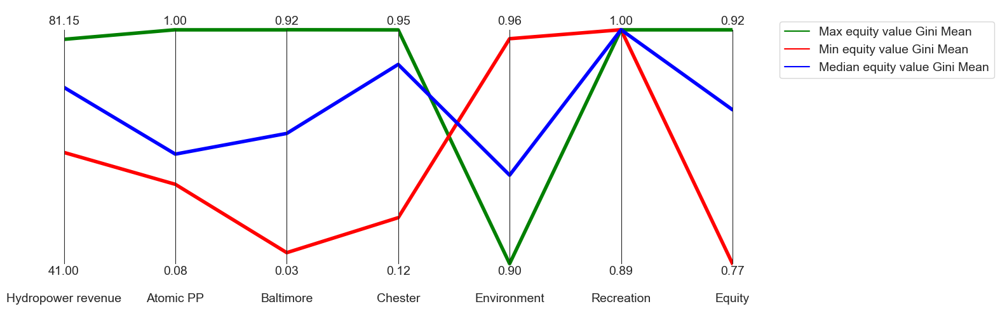

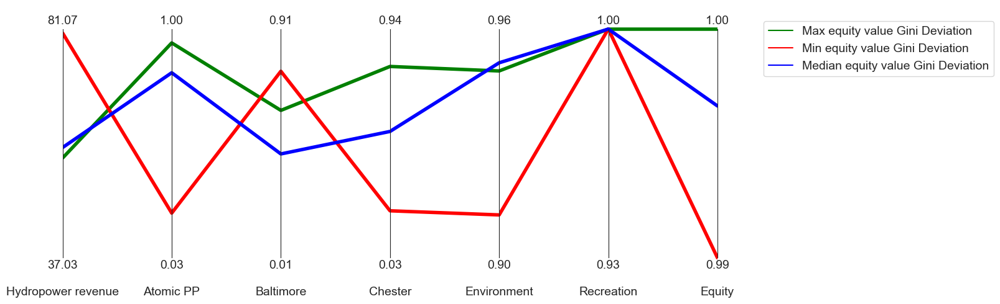

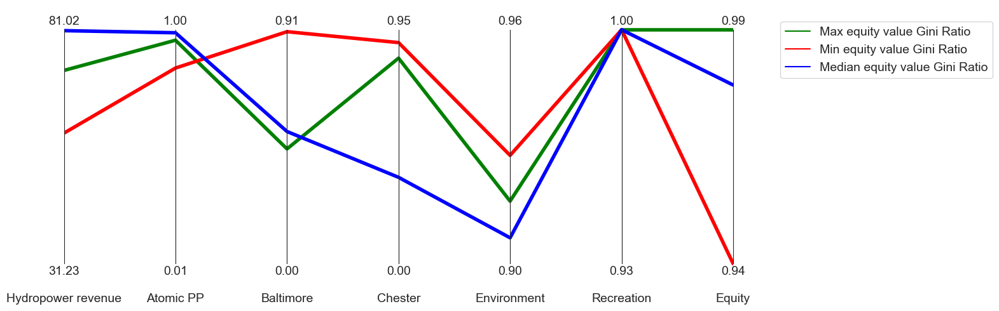

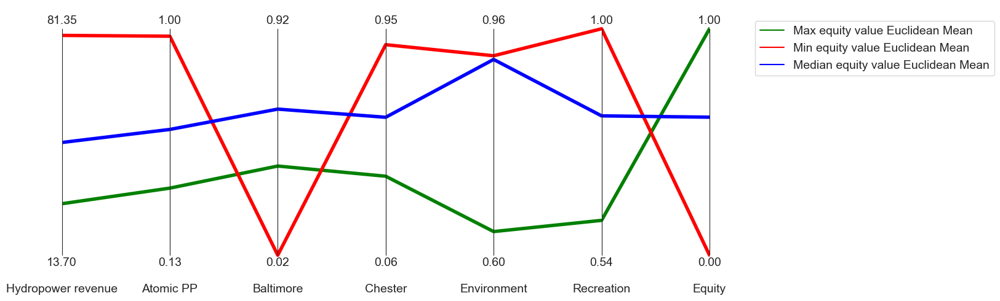

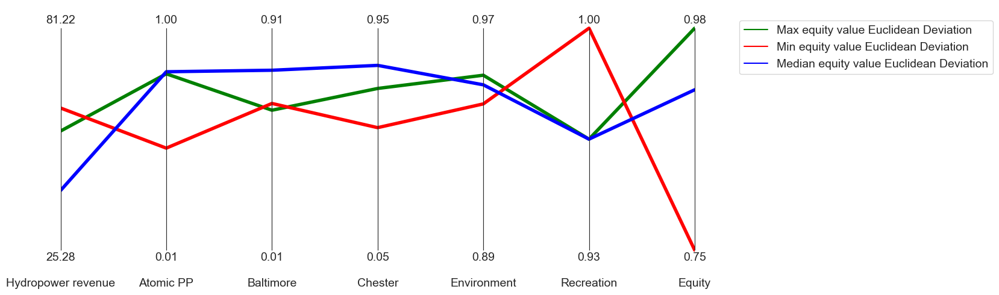

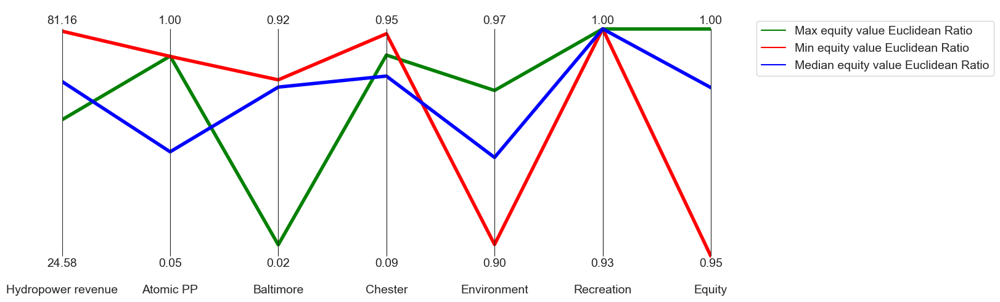

In [753]:
# for the other visualizations
plt.rcParams['figure.figsize'] = [12, 5]

ethical_formulations_experiment_name = ['Traditional', 'Gini Mean', 'Gini Deviation', 'Gini Ratio', 'Euclidean Mean', 'Euclidean Deviation', 'Euclidean Ratio',]

j = 1
for (k,v), c in zip(dict_principles_objectives.items(), sns.color_palette()):
    df_principle = pd.DataFrame(dict_principles_objectives[k].iloc[:,-7:])

    if k != ethical_formulations[0]:
        df_median = get_median((dict_principles_objectives[k].iloc[:,-7:]), 'Equity',1)
        df_max = get_max((dict_principles_objectives[k].iloc[:,-7:]), 'Equity',1)
        df_min = get_min((dict_principles_objectives[k].iloc[:,-7:]), 'Equity',1)

        limits = get_limits(df_principle)
        axes = ParallelAxes(limits, rot=0)    
        axes.plot(df_max, label=f'Max equity value {ethical_formulations_experiment_name[j]}', lw=4, color='green', alpha=1)
        axes.plot(df_min, label=f'Min equity value {ethical_formulations_experiment_name[j]}', lw=4, color='red', alpha=1)
        axes.plot(df_median, label=f'Median equity value {ethical_formulations_experiment_name[j]}', lw=4, color='blue', alpha=1)
        j+=1
        axes.legend()
        plt.savefig(f'figs/{k}_max_median_min_solutions_Parallel_Plot.png', dpi=300, bbox_inches='tight')


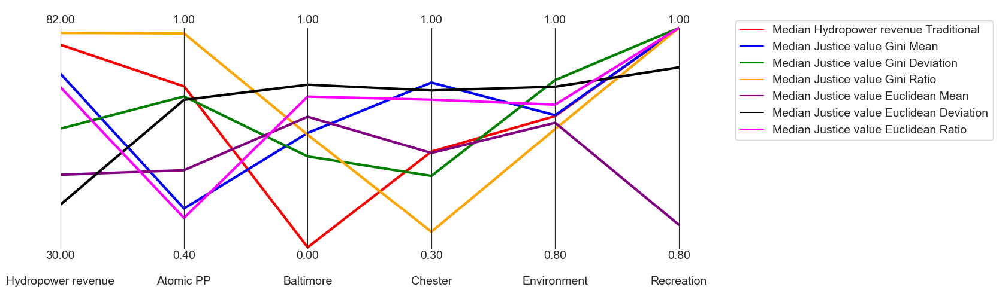

In [752]:
# for the other visualizations
plt.rcParams['figure.figsize'] = [12, 5]

ethical_formulations_experiment_name = ['Traditional', 'Gini Mean', 'Gini Deviation', 'Gini Ratio', 'Euclidean Mean', 'Euclidean Deviation', 'Euclidean Ratio',]

# Define colors for each line
colors = ['red', 'blue', 'green', 'orange', 'purple', 'black', 'magenta']

df_principle = pd.DataFrame(dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:-1])

df_median_gini_m = get_median((dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]), 'Equity',1)
df_median_gini_std = get_median((dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:]), 'Equity',1)
df_median_gini_r = get_median((dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:]), 'Equity',1)

df_median_eucli_m = get_median((dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]), 'Equity',1)
df_median_eucli_std = get_median((dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]), 'Equity',1)
df_median_eucli_r = get_median((dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]), 'Equity',1)

df_median_trad = get_median((dict_principles_objectives[ethical_formulations[0]].iloc[:,-7:]), 'Equity',1)

limits = get_limits(df_principle)

limits.loc[0] = [30,0.4,0,0.3,0.8,0.8]
limits.loc[1] = [82,1,1,1,1,1]

axes = ParallelAxes(limits, rot=0) 
axes.plot(df_median_trad.iloc[:,-7:-1], label=f'Median Hydropower revenue {ethical_formulations_experiment_name[0]}', lw=3, alpha=1, color=colors[0])
axes.plot(df_median_gini_m.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[1]}', lw=3, alpha=1, color=colors[1])
axes.plot(df_median_gini_std.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[2]}', lw=3, alpha=1, color=colors[2])
axes.plot(df_median_gini_r.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[3]}', lw=3, alpha=1, color=colors[3])
axes.plot(df_median_eucli_m.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[4]}', lw=3, alpha=1, color=colors[4])
axes.plot(df_median_eucli_std.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[5]}', lw=3, alpha=1, color=colors[5])
axes.plot(df_median_eucli_r.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[6]}', lw=3, alpha=1, color=colors[6])

axes.legend()
plt.savefig(f'figs/median_solutions_Parallel_Plot.png', dpi=300, bbox_inches='tight')


**Across formulations median value**

The median solution of the Traditional Formulation has high values for the Hydropower revenue. Conversely Baltimore has no water allocated in this case. Other objectives will gain a reliability between 60-90\%, with the Atomic PP receiving the highest value out of the remaining objectives. The strongest trade-off will lie between the Hydropower revenue, together with the Environment and Recreation (on the high side), and Baltimore on the other (low) side. Chester gains a reliability close to 60\%, leading to a weaker trade-off than for Baltimore.

The median value of the Gini Mean shows that the trade-off between high performance values for the Hydropower revenue, Atomic PP, Chester, and low values for Baltimore, are now reduced compared to the Traditional Formulation. Moreover, the trade-off on the Pareto front changes. The Atomic PP drops around 30\% relative to the pattern of solutions observed for the Traditional Formulation. Chester, and the Environment benefit from this drop for the Atomic PP. While the Mann Whitney analysis indicated that the pattern of distribution of the Gini Mean between Atomic PP and Chester will be similar to the pattern of distribution observed for the Traditional Formulation, I observe that Chester now has higher objective values than the Atomic PP. Hence, the trade-off changes. The Environment, and Recreation gain a similar value.

Conversely, the Gini Deviation formulation follows a weaker trade-off across objectives, or a more horizontal pattern across objectives. The Hydropower revenue drops even more than for the Gini Mean, while the Atmoic PP stays approximately at the same value as the Traditional Formulation. Baltimore's values drops again below Chester's objective values for the Gini Mean, but will be significantly higher compared to the Traditional Formulation. Other objectives seem to lie relatively around the same value. The median solution of the Gini Ratio actually creates a stronger trade-offs than for the previous formulation. On the other hand, while the values for the Hydropower revenue, Atomic PP, and Recreation are maximal, Baltimore gains equal reliability as the Gini Mean. For the Environment this drop is less significant. Across the Gini Formulations, this formulation will also yield the lowest value for the Environment, and Chester. Hence, the trade-off across objectives is strong, but weaker and across other objectives than for the Traditional Formulation.

In terms of horizontal (egalitarian) behaviour across objectives, the Gini Mean and Gini Deviation are similar, but allocate water differently. The Gini Ratio is very different to the other Gini Formulations, but it does not seem to show more horizontal behaviour. A reason could be that while trying to achieve justice across two different aggregations over time, the optimization cancels out the benefit achieved from one or the other, and thus will basically just shift the traditional Pareto front.

In terms of their own equity value, the median solution for each formulation yields higher justice values than the justice value from the median solution of Hydropower revenue of the Traditional Formulation. However, when I observe the horizontal behaviour between the median of the Traditional Formulation and other formulations of the Gini, except for the Gini Ratio, the difference is negligible. 

When I observe the Euclidean formulations, the trade-offs are significantly weak compared to other formulations (including the Traditional). While the performance value of Hydropower drops, other objectives gain from this. For the Euclidean Mean, the Recreation objective drops to around 80\% which is still deemed satisfactory when considering performance (i.e. to maximize the objective). Moreover, for the Euclidean Deviation it can be observed that when the Hydropower revenue further drops, significantly higher, and horizontal values can be achieved for the other objectives. I can infer from this that the Euclidean formulation penalizes large relative distances between objectives. This is why objectives such as the Hydropower revenue, and the Recreation which would have the highest value have dropped at significantly a lower value.

The Euclidean Ratio is the first to show a trade-off between relatively high Hydropower values and the low Atomic PP values. Yet, it is the first formulation that yields high values for both the Baltimore and Chester objectives at an equal level. The Environment drops to approximately 94\%, and the Recreation remains at 100\%. In the Equity objective value it is less notable if the Equity has increased relative to the Traditional Formulation.

It can be observed that the Euclidean formulations lead to a more horizontal distribution of objectives, at the expense of previously highly valued objectives. The Gini formulations on the other hand will make the trade-off across objectives weaker, but its implementation will still benefit certain objectives significantly more than others.

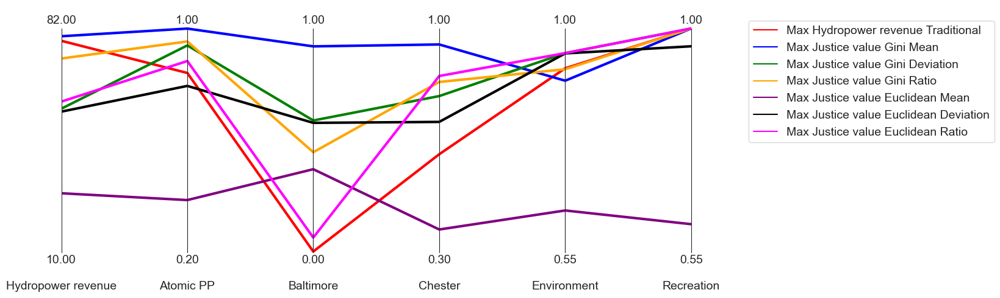

In [766]:
# for the other visualizations
plt.rcParams['figure.figsize'] = [12, 5]

ethical_formulations_experiment_name = ['Traditional', 'Gini Mean', 'Gini Deviation', 'Gini Ratio', 'Euclidean Mean', 'Euclidean Deviation', 'Euclidean Ratio',]

# Define colors for each line
colors = ['red', 'blue', 'green', 'orange', 'purple', 'black', 'magenta']

df_principle = pd.DataFrame(dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:-1])

df_max_gini_m = get_max((dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]), 'Equity',1)
df_max_gini_std = get_max((dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:]), 'Equity',1)
df_max_gini_r = get_max((dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:]), 'Equity',1)

df_max_eucli_m = get_max((dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]), 'Equity',1)
df_max_eucli_std = get_max((dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]), 'Equity',1)
df_max_eucli_r = get_max((dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]), 'Equity',1)

df_max_trad = get_max((dict_principles_objectives[ethical_formulations[0]].iloc[:,-7:]), 'Equity',1)

limits = get_limits(df_principle)

limits.loc[0] = [10,0.2,0,0.3,0.55,0.55]
limits.loc[1] = [82,1,1,1,1,1]

axes = ParallelAxes(limits, rot=0) 
axes.plot(df_max_trad.iloc[:,-7:-1], label=f'Max Hydropower revenue {ethical_formulations_experiment_name[0]}', lw=3, alpha=1, color=colors[0])
axes.plot(df_max_gini_m.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[1]}', lw=3, alpha=1, color=colors[1])
axes.plot(df_max_gini_std.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[2]}', lw=3, alpha=1, color=colors[2])
axes.plot(df_max_gini_r.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[3]}', lw=3, alpha=1, color=colors[3])
axes.plot(df_max_eucli_m.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[4]}', lw=3, alpha=1, color=colors[4])
axes.plot(df_max_eucli_std.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[5]}', lw=3, alpha=1, color=colors[5])
axes.plot(df_max_eucli_r.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[6]}', lw=3, alpha=1, color=colors[6])

axes.legend()
plt.savefig(f'figs/max_solutions_Parallel_Plot.png', dpi=300, bbox_inches='tight')


**Across formulations max value**

For the Gini Mean, very high values can be reached for each objective. Almost all objectives are close to 100\% of the values they can reach. This is similar to the small subset of solution observed for the Traditional Formulation. Only the environment that reaches a reliability of 90\%. 90\% is still high considering the median and minimum value lie around 95\%, indicating a drop of around 5% while ensuring high objective values for other objectives. In comparison with the Gini Deviation, I observe that the hydropower revenue drops by around 30\% of its max. The objectives of the Atomic PP, Baltimore, Chester, obtain lower values compared to Traditional Formulation (with Baltimore around 25% lower), but for the Environment this again reaches rises to around 95%. Hence, the max distributive justice value of the Gini Deviation formulation shifts the traditional Pareto front to higher values for the Environment. Likewise for the mean analysis, the Gini Ratio shows stronger trade-offs than other Gini Formulations. For the Atomic PP, Baltimore, Chester, the Environment, and Recreation, the difference with the Gini Deviation is negligible. This aligns with the findings during the Mann Whitney analysis that the pattern of trade-off distribution of the Gini Deviation will be similar to the Gini Ratio. This is due to the dominant influence of the Gini Deviation in the formulation. Overall, the Gini Mean seems to perform best while still reaching quite a horizontal solution. This is interesting, because in the median analysis the Gini Deviation would provide a more horizontal solution.

For the Gini Ratio the objective value for Baltimore drops even more (around 50 \% relative to the Gini Mean), the Environment is around 90\%, Hydropower revenue is close to its maximum value. It must be acknowledged that both the Gini Deviation and Gini Ratio ensure a somewhat horizontal line, with less strong trade-offs across objectives. Nonetheless, the Gini Mean provides a more horizontal line across objectives at the cost of a 5\% drop for the Environment.

Remarkably, the Euclidean Mean achieves a horizontal line across objectives as well, with the difference that now Baltimore will have the highest value. This points to what was mentioned before where objectives with a high gain receive less, and objective with less gain, will now receive more. However, this is heavily at the cost of the efficiency of objectives, because all objective values experience a significant drop. Hydropower revenue is close to 14 M which is the lowest across all objectives, the Atomic PP has a value close to 15\%, Baltimore around 2\%, Chester around 30\%, and for the first time, the Environment is around 60 \%, and the Recreation objective drops close to 60\%. Nonetheless, trade-offs across objectives are not apparent, and in that sense more distributive justice is reached (a more horizontal line) at the heavy cost of the objective performance values. The Euclidean Deviation will also show a more horizontal line across objectives. However, the performance for the objectives will be higher relative to the Euclidean Mean. The Gini formulations (except the Gini Mean) will have higher performance performance values but a stronger trade-off across objectives. The Euclidean Ratio shows trade-off similar to the Traditional Formulation, with the difference that the relative difference in values is less severe. The Hydropower revenue drops, but the Environment increases by around 5\%. Hence, what is lost in Hydropower revenue, goes mostly to the Environment, while the values for other objectives becomes more equal across objectives. It seems that the Euclidean Ratio cancels out the justice effects achieved from the Euclidean methods separately.

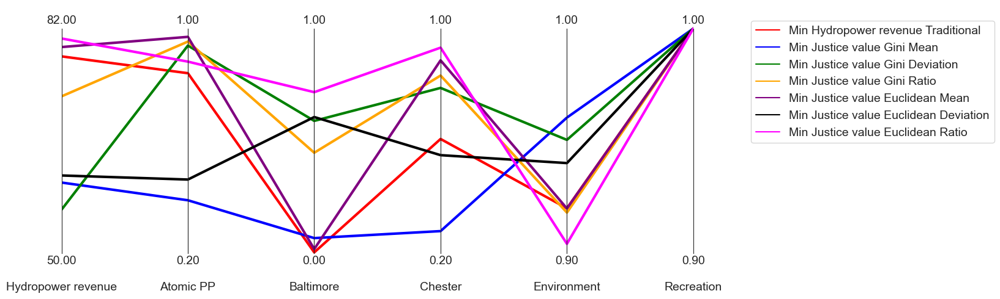

In [767]:
# for the other visualizations
plt.rcParams['figure.figsize'] = [12, 5]

ethical_formulations_experiment_name = ['Traditional', 'Gini Mean', 'Gini Deviation', 'Gini Ratio', 'Euclidean Mean', 'Euclidean Deviation', 'Euclidean Ratio',]

# Define colors for each line
colors = ['red', 'blue', 'green', 'orange', 'purple', 'black', 'magenta']

df_principle = pd.DataFrame(dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:-1])

df_min_gini_m = get_min((dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]), 'Equity',1)
df_min_gini_std = get_max((dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:]), 'Equity',1)
df_min_gini_r = get_max((dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:]), 'Equity',1)

df_min_eucli_m = get_min((dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]), 'Equity',1)
df_min_eucli_std = get_min((dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]), 'Equity',1)
df_min_eucli_r = get_min((dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]), 'Equity',1)

df_min_trad = get_min((dict_principles_objectives[ethical_formulations[0]].iloc[:,-7:]), 'Equity',1)

limits = get_limits(df_principle)

limits.loc[0] = [50,0.2,0,0.2,0.9,0.9]
limits.loc[1] = [82,1,1,1,1,1]

axes = ParallelAxes(limits, rot=0) 
axes.plot(df_min_trad.iloc[:,-7:-1], label=f'Min Hydropower revenue {ethical_formulations_experiment_name[0]}', lw=3, alpha=1, color=colors[0])
axes.plot(df_min_gini_m.iloc[:,-7:-1], label=f'Min Justice value {ethical_formulations_experiment_name[1]}', lw=3, alpha=1, color=colors[1])
axes.plot(df_min_gini_std.iloc[:,-7:-1], label=f'Min Justice value {ethical_formulations_experiment_name[2]}', lw=3, alpha=1, color=colors[2])
axes.plot(df_min_gini_r.iloc[:,-7:-1], label=f'Min Justice value {ethical_formulations_experiment_name[3]}', lw=3, alpha=1, color=colors[3])
axes.plot(df_min_eucli_m.iloc[:,-7:-1], label=f'Min Justice value {ethical_formulations_experiment_name[4]}', lw=3, alpha=1, color=colors[4])
axes.plot(df_min_eucli_std.iloc[:,-7:-1], label=f'Min Justice value {ethical_formulations_experiment_name[5]}', lw=3, alpha=1, color=colors[5])
axes.plot(df_min_eucli_r.iloc[:,-7:-1], label=f'Min Justice value {ethical_formulations_experiment_name[6]}', lw=3, alpha=1, color=colors[6])

axes.legend()
plt.savefig(f'figs/min_solutions_Parallel_Plot.png', dpi=300, bbox_inches='tight')


**Across formulations minimum value**

From a hollistic observation across formulations, I observe that most formulations show far from a horizontal line across all objectives. The Traditional Formulation shows a strong trade-off, but an even stronger trade-off is achieved by the Euclidean Deviation. In both cases, the Hydropower Revenue, Atomic PP, Chester, the Environment, and Recreation gain a high value, while Baltimore and Chester are worse off. The demand of Chester is similar to the Atomic PP (in the range of 100,000 m^{3}/day), indicating that there is a high degree of inequality reached from this solution. There are exceptions. the Euclidean Ratio has high objective values with a drop of approximately 5\% on the Environment to compensate this. Also in the justice value this difference is just 5\% relative to the Traditional Formulation. **Hence, the minimum value of the Euclidean Ratio will actually be able to find a suitable balance between efficiency and equity. Moreover, this behaviour resembles the trade-off of the Gini Mean when the maximum solution is compared.** For other formulations, I observe that there is always at least one objective with high value, while other remain significantly low. There is some similarity with other indicators such as the minimum value of the Euclidean Mean will strongly resemble the trade-off for the maximum solution value of the Traditional. For the Euclidean Deviation the trade-off line is still relatively horizontal across objectives, but the difference in the horizontal line can be noted to be stronger for the median solution. 




To compare the most solutions with the most horizontal line, and hence showcasing the behaviour with most distributive justice, I will show them in one plot so they can better be compared for a trade-off between efficiency and equity.

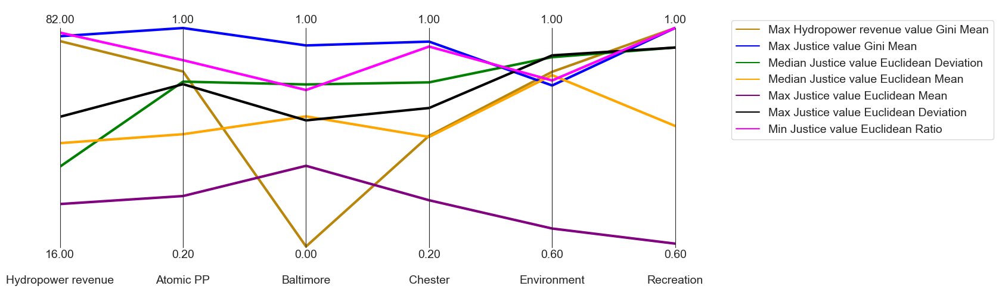

In [756]:
# for the other visualizations
plt.rcParams['figure.figsize'] = [12, 5]

ethical_formulations_experiment_name = ['Traditional', 'Gini Mean', 'Gini Deviation', 'Gini Ratio', 'Euclidean Mean', 'Euclidean Deviation', 'Euclidean Ratio',]

# Define colors for each line
colors = ['red', 'blue', 'green', 'orange', 'purple', 'black', 'magenta', 'darkgoldenrod']

df_principle = pd.DataFrame(dict_principles_objectives[ethical_formulations[0]].iloc[:,-7:-1])

df_max_gini_m = get_max((dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]), 'Equity',1)
df_max_eucli_m = get_max((dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]), 'Equity',1)
df_max_eucli_std = get_max((dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]), 'Equity',1)
df_min_eucli_r = get_min((dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]), 'Equity',1)
df_median_eucli_m = get_median((dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]), 'Equity',1)
df_median_eucli_std = get_median((dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]), 'Equity',1)

df_min_trad = get_min((dict_principles_objectives[ethical_formulations[0]].iloc[:,-7:]), 'Equity',1)

limits = get_limits(df_principle)

limits.loc[0] = [16,0.2,0,0.2,0.6,0.6]
limits.loc[1] = [82,1,1,1,1,1]

axes = ParallelAxes(limits, rot=0) 
axes.plot(df_max_trad.iloc[:,-7:-1], label=f'Max Hydropower revenue value {ethical_formulations_experiment_name[1]}', lw=3, alpha=1, color=colors[7])
axes.plot(df_max_gini_m.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[1]}', lw=3, alpha=1, color=colors[1])
axes.plot(df_median_eucli_std.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[5]}', lw=3, alpha=1, color=colors[2])
axes.plot(df_median_eucli_m.iloc[:,-7:-1], label=f'Median Justice value {ethical_formulations_experiment_name[4]}', lw=3, alpha=1, color=colors[3])
axes.plot(df_max_eucli_m.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[4]}', lw=3, alpha=1, color=colors[4])
axes.plot(df_max_eucli_std.iloc[:,-7:-1], label=f'Max Justice value {ethical_formulations_experiment_name[5]}', lw=3, alpha=1, color=colors[5])
axes.plot(df_min_eucli_r.iloc[:,-7:-1], label=f'Min Justice value {ethical_formulations_experiment_name[6]}', lw=3, alpha=1, color=colors[6])

axes.legend()
plt.savefig(f'figs/best_solutions_Parallel_Plot.png', dpi=300, bbox_inches='tight')


As seen on the plot, the Euclidean formulations, regardless of the statistical indicator (max, min, median) are always part of the solutions with an ideal horizontal behaviour across objectives. In contrast, when it is compared to the max Hydropower revenue solution, it can be seen just how much justice is achieved across solutions. For the median Euclidean Mean this comes at the cost of performance of all objectives. The Euclidean Deviation again increases this performance in desired value. Max Gini Mean is also able to achieve an egalitarian behaviour at an even higher performance value across objectives, as well as the min Euclidean Ratio. The median Euclidean Deviation will again show that while there is more desired horizontal behaviour, one of the objectives will need to gain less for this to be possible.

Overall, the Pareto front is shifting differently across formulation, without a fixed pattern across inequality metric, or across aggregation method. Nevertheless, the goal is to achieve more horizontal behaviour, while keeping performance as high as possible. The complementing distributive justice formulation are able to do exactly this. The preference of choice to use will depend on what the desired justice behaviour is. Would the stakeholders always want horizontal behaviour and maximize objectives, then it is best to consider the median solution. Would they want to be more risk aversive in terms of injustices, then in order to avoid less ideal solutions analyzing the min justice solution is key, and so on.

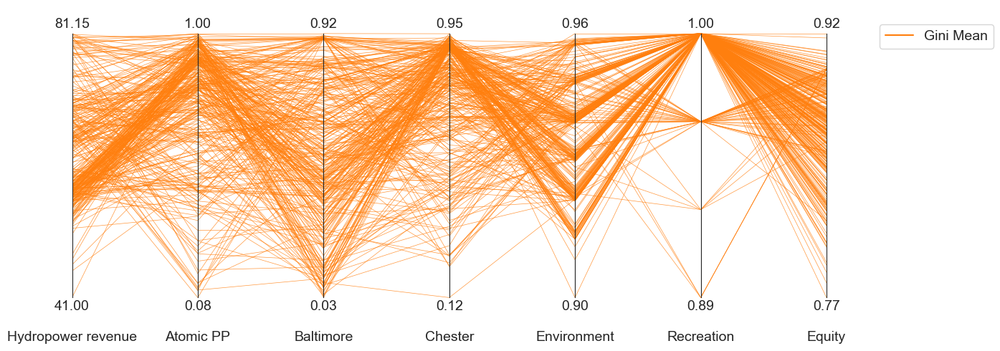

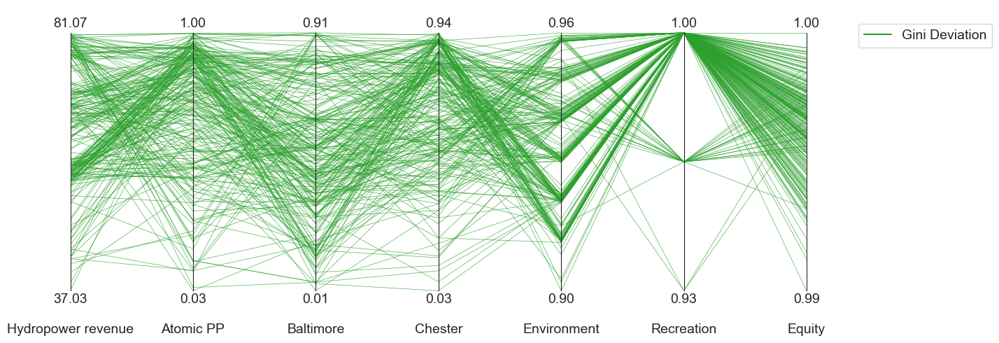

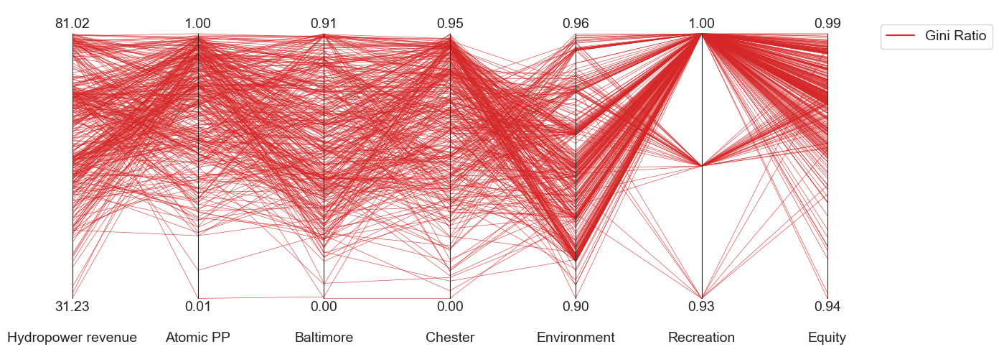

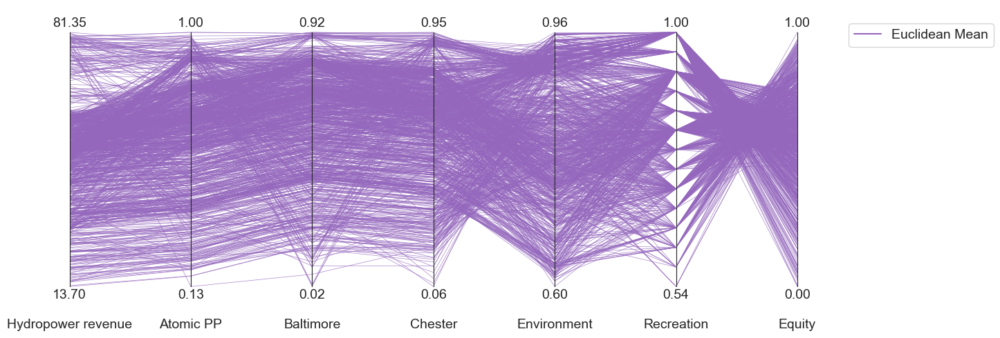

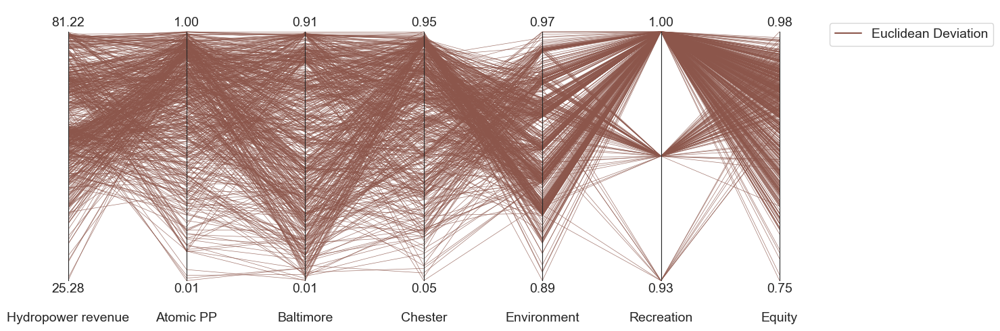

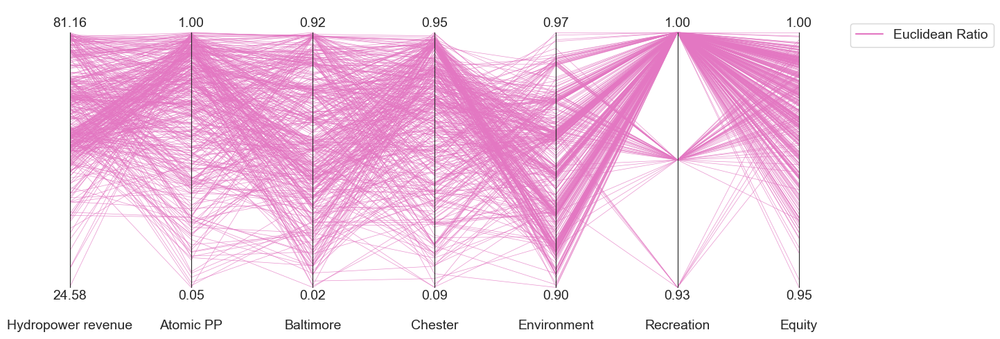

In [760]:
# for the other visualizations
plt.rcParams['figure.figsize'] = [12, 5]

ethical_formulations_experiment_name = ['Traditional', 'Gini Mean', 'Gini Deviation', 'Gini Ratio', 'Euclidean Mean', 'Euclidean Deviation', 'Euclidean Ratio',]

j = 1
for (k,v), c in zip(dict_principles_objectives.items(), sns.color_palette()):
    df_principle = pd.DataFrame(dict_principles_objectives[k].iloc[:,-7:])

    if k != ethical_formulations[0]:
        limits = get_limits(df_principle)
        axes = ParallelAxes(limits, rot=0)    

        axes.plot(v, label=ethical_formulations_experiment_name[j], color=c, lw = 0.5, alpha=0.8)
        axes.legend()
        plt.savefig(f'figs/{k}_all_solutions_Parallel_Plot.png', dpi=300, bbox_inches='tight')
        j+=1


**Across formulations all solutions** 

The solutions from each formulation have similar ranges for the objectives when we consider all solutions.

It is interesting to note that according to each formulation, high equity values are reached. For example, F3 ranges between 0.99 and 1, F7 between 0.95 and 1, and so on. **A limitation of this analysis is the fact that the reliability of every objective is relative to their own demand. Because of this, if we calculate the relative distance through inequality metrics, the inequality metric in itself will not lie within reasonable ranges.** Only F3, F5, and F6 indicate a larger range of possible equity values. The problem is that they are expressed in their own operationalization formulation, making it impossible to compare the levels of equity reached when compared to each other. Luckily, in the boxplot analysis I will choose one of the operationalization formulation for the justice principle as a reference where the other formulations are converted to their equivalent value since the model calculates the value for other formulations as well without optimizing over them. This means that I am able to find out what a 0.95 value for equity of F7 means in terms of F3 that ranges between 0.99 and 1. This will be analyzed further in the boxplot analysis. 

Across formulations, when I compare all solutions (all the lines of the same color as the formulation number) we see that F2, F3, F4, F6, F7 share a similar trade-off across the traditional objectives. Here, Hydropower will range between 40-50 M, the Atomic power plant with reliability close to 100\%, Baltimore with reliability to 0\%, Chester with reliability close to 95\%, the Environment with reliability ranging reasonably uniformly between 90 \% and 97 \%, the Recreation with a reliability close to 100 \%. Hence, there is a strong trade-off where Baltimore, and the Hydropower gain less reliability in exchange that other objectives receive this reliability. F4 (Gini Ratio) shows more solutions compared to other formulations, where the hydropower revenue is higher than revenue of 50 M identified by the main trend. Moreover, it is at F4 that the solutions increase the reliability of Baltimore from 0\% to around 20\%. F6 (Euclidean Std) shows slightly higher reliability values for the Environment objective, but still seems to be around the same range as other formulations.

As I observed in the statistical analysis, across all formulations there are a vast amount of solutions where the atomic power plant receives similar reliability values, close to 100\%. There are however a significant number of solutions where this is not the case. Here, the values can drop as low as to 1\% (for F6) to 13\% (as for F5).

Between these formulations, although I see a pattern between all of the solutions for each formulation, it also stands out that F5 follows none of these patterns. When we observe how the trade-off is across objectives for F5, the solutions are more horizontal, and lie relatively close to the maximum value that can be achieved. For example, we see many solutions showing reliability values for Baltimore, Chester of around 90-95\%. Here, the Hydropower revenue, and Atomic Power Plant gain slightly less compared to the pattern observed for other formulations. Solutions for the Atomic Power Plant may now range between 70-90\%. However, the horizontal behaviour is not achieved without allocating less water to other objectives. Exactly this is what we observe for the Environment and Recreation. While most solutions of other formulations had a reliability close to 100\%, now the recreation ranges between 50 \% and 100 \%, which is considered a wide range of possible values. Moreover, I observe that the solutions now yield a reliability of around 60\% for the Environment, and hence as also significantly dropped. 

From an observation, we can consider a more horizontal solution, as more equitable, because although the efficiency, every objective is satisfied roughly to an equal extent. Hence, F5 (Euclidean Mean) shows a more just behaviour than other objectives. However, this is from a visual inspection. To continue understanding what the difference is across formulations, I require to look when the equity reaches its extremes, and expected value. I am talking about the solution with the maximum equity value (upper extreme), minimum equity value (lower extreme), and median equity value (expected value).

Because I want to see how the behaviour is across justice principles when we choose one of them as reference, and because the Parallel Axis Plot suffers from the limitations where only the minimum and maximum can be displayed on the Axis, the Boxplot graph gives more insight into how solutions are distributed, by showing the outliers, and interquantile range for each distribution, and each formulation.

## General observations of the trade-off analysis from the Parallel Axes Plot

While the justice value signifies similar values of justice achieved when we compare the justice formulations to the other distributive justice formulations, we do see that the trade-off becomes less strong, and in some cases even reach a more horizontal pattern across all solutions. Compared to the traditional principle where only the solutions with the lowest hydropower revenue (a few) show a horizontal behaviour across traditional objectives, the majority of solutions from the distributive justice formulations show this desired horizontal behaviour. Hence, optimizing over the distributive justice objective ensures less strong trade-offs without significantly bringing the efficiency down.

We notice:
* The solution with the minimum, median, and maximum value of distributive justice shows significant different behaviour across these three indicators. This leads to a case where the implications drawn from the Pareto front shift from each formulations depends on the indicator used.
* An alternative is analyzing all solutions as shown in Appendix xx. However, due to the amount of solutions, it is more difficult to determine the Pareto front shift. One requires looking at patterns across all solutions. From this pattern, and the previous statistical analysis, I derive that the Euclidean formulations cause more horizontal behaviour than the Gini formulations.
* The Gini formulations show stronger trade-offs in the Pareto front of the median than the Euclidean formulations. Nonetheless, Gini formulations make the trade-offs weaker (less differences in values across objectives) relative to F1, and also different to F1 since previously weakly satisfied objective such as Baltimore will now have higher objective values than other objectives (e.g., Chester).
* The Gini formulations (F2, F3, and F4) does not lead to a significant shift in the Pareto front.
* The Euclidean Mean (F5) shows the most significant horizontal behaviour across objectives for the median and maximum value. The Euclidean Std will 
* I do not observe a similarity between the Std, or Ratio across inequality metric formulation. Hence, the trade-off between each formulation is distinctive.
* F5 and F6 show the most stable solution range between minimum and maximum justice value.
* While optimization is being performed over the justice objective, the intrinsic value of the metric is less informative because the relative distance is calculated for objectives that have their own reference value, making the final value inadequate for analysis. 
* A solution to this was observing which solution in F1 leads to the strongest and weakest trade-off, and comparing it to the expected justice value. Thereafter I find that the Gini Mean and Euclidean Mean formulation appropiately captures when trade-offs on the Pareto front change. Since the Euclidean Mean was normalized to its own range, it shows a wider range of possible justice values, making it easier to analyze when certain values have been reached.

In terms of median formulations:
* For the Gini formulations, F2 and F3 shift the Pareto front to weaker trade-offs across objectives. F4 on the other hand will yield a Pareto front with stronger trade-offs across objectives than previously formulated for F1.
* Euclidean formulations leads to a Pareto front shift where water for Hydropower revenue is distributed to other objectives that had previously low objective values. In this sense, the Pareto front shifts to a more egalitarian distribution across objectives.

In terms of maximum formulations:
* For the Gini formulations, F2 balances efficiency and equity. F3 on the other hand has significantly lower objective values, but will show a more horizontal line across objectives where mild trade-offs remain. F4 leads to a Pareto front with stronger trade-offs between Hydropower revenue, Atomic PP, Rcereation, and lower values for Baltimore, Chester, and the Environment. Hence, F3 will achieve more egalitarian justice at the cost of efficiency, while F4 gives a higher priority to efficiency of certain objectives.
* For the Euclidean formulations, F5 and F6 perform well in terms of distributive justice since one can observe a Pareto front that is close to horizontal. This is however at the cost of objective values that for other formulations are higher. F7 does not follow this pattern and can be observed to reallocate water from Hydropower revenue mostly to the Environment. F7 will thus not achieve a more horizontal line. While it cannot be shown in this graph, the Standard deviation effect in both F6 and F7 will be playing a stronger role on the intertemporal aspect than shown on this visualization looking at yearly means.

In terms of minimum formulations:
* Most of the formulations will shift the Pareto front to stronger trade-off between one or more objectives. Often Hydropower revenue, and Recreation will then obtain higher values compared to other objectives. F4 and F6 still manage to achieve a more horizontal Pareto front across objectives. Still, as expected, the minimum solutions perform less well than the median and maximum solutions.
* F7 actually achieves both high objective values, and a more horizontal line. While the Environment objective drops by 5-10\% its objective still reaches a reliability of 90\%. Hence, F7 balances efficiency and equity, bringing the Pareto front up relative to F1 (the objective values of F1).




In general:
* Each formulation has its own Pareto front shift, and in that sense not only affects across which objectives there is a trade-off, but also the strength of these trade-offs. 
* F6 provides the most stable solutions across statistical indicator.


In [30]:
# df_gini_mean_full_set = dict_principles_objectives[ethical_formulations[1]]
# df_gini_std_full_set = dict_principles_objectives[ethical_formulations[2]]
# df_gini_ratio_full_set = dict_principles_objectives[ethical_formulations[3]]
# df_eucli_mean_full_set = dict_principles_objectives[ethical_formulations[4]]
# df_eucli_std_full_set = dict_principles_objectives[ethical_formulations[5]]
# df_eucli_ratio_full_set = dict_principles_objectives[ethical_formulations[6]]
# df_traditional_full_set = dict_principles_objectives[ethical_formulations[0]]

# # new_columns = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation', 'Equity']

# # df_gini_mean_full_set.columns = new_columns
# # df_gini_std_full_set.columns = new_columns
# # df_gini_ratio_full_set.columns = new_columns
# # df_eucli_mean_full_set.columns = new_columns
# # df_eucli_std_full_set.columns = new_columns
# # df_eucli_ratio_full_set.columns = new_columns
# # df_traditional_full_set.columns = new_columns

# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6]).abs()
# df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[:,0:6]).abs()
# df_gini_ratio = pd.DataFrame(df_gini_ratio_full_set.iloc[:,0:6]).abs()
# df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[:,0:6]).abs()
# df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[:,0:6]).abs()
# df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[:,0:6]).abs()
# df_eucli_ratio = pd.DataFrame(df_eucli_ratio_full_set.iloc[:,0:6]).abs()

### Contrasting two formulations

In [463]:
# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6]).abs()
# df_gini_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]).abs()
# df_gini_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:]).abs()
# df_gini_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:]).abs()

# df_eucli_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]).abs()
# df_eucli_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]).abs()
# df_eucli_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]).abs()

# df_list = []

In [462]:

# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()
# colors = sns.color_palette("Set3", n_colors=len(df_traditional))

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]


# indexes = ['Traditional Problem','Gini Mean Problem']
# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
# axes.plot(df_gini_mean, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

# axes.legend()

In [460]:
# print(len(df_traditional))
# print(len(df_gini_mean))

In [459]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]


# indexes = ['Traditional Problem','Gini Std Problem']

# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=1)
# axes.plot(df_gini_std, color= 'r', label = indexes[1], lw=0.05, alpha=1)

# axes.legend()

In [461]:
# print(len(df_traditional))
# print(len(df_gini_std))

In [458]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]


# indexes = ['Traditional Problem','Gini Ratio Problem']

# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=1)
# axes.plot(df_gini_ratio, color= 'r', label = indexes[1], lw=0.05, alpha=1)

# axes.legend()

In [457]:
# print(len(df_traditional))
# print(len(df_gini_ratio))

In [456]:

# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]


# indexes = ['Traditional Problem','Euclidean Mean Problem']

# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=1)
# axes.plot(df_eucli_mean, color= 'r', label = indexes[1], lw=0.05, alpha=1)

# axes.legend()

In [455]:
# print(len(df_traditional))
# print(len(df_eucli_mean))

In [454]:
# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6])
# df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[:,0:6])
# df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[:,0:6])
# df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[:,0:6])
# df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[:,0:6])

# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['Traditional Problem','Euclidean Std Problem']

# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=1)
# axes.plot(df_eucli_std, color= 'r', label = indexes[1], lw=0.05, alpha=1)

# axes.legend()

In [464]:
# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6])
# df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[:,0:6])
# df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[:,0:6])
# df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[:,0:6])
# df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[:,0:6])

# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,1,0]
# limits.loc[1] = [82,1,1,1,0,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['Traditional Problem','Euclidean Ratio Problem']

# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
# axes.plot(df_eucli_ratio, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

# axes.legend()

## Try visualizing trade-off with a smaller dataset, the 5 best equity values, and for traditional the 5 highest revenue values

In [609]:
# ethical_formulations

In [610]:
# df_gini_mean_full_set = dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_gini_std_full_set = dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_gini_ratio_full_set = dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_eucli_mean_full_set = dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_eucli_std_full_set = dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_eucli_ratio_full_set = dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_traditional_full_set = dict_principles_objectives[ethical_formulations[0]].sort_values(by = 'hydropower revenue', ascending = False).abs()

# new_columns = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation', 'Equity']

# df_gini_mean_full_set.columns = new_columns
# df_gini_std_full_set.columns = new_columns
# df_gini_ratio_full_set.columns = new_columns
# df_eucli_mean_full_set.columns = new_columns
# df_eucli_std_full_set.columns = new_columns
# df_eucli_ratio_full_set.columns = new_columns
# df_traditional_full_set.columns = new_columns

# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[0:5,0:6]).abs()
# df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[0:5,0:6]).abs()
# df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[0:5,0:6]).abs()
# df_gini_ratio = pd.DataFrame(df_gini_ratio_full_set.iloc[0:5,0:6]).abs()
# df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[0:5,0:6]).abs()
# df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[0:5,0:6]).abs()
# df_eucli_ratio = pd.DataFrame(df_eucli_ratio_full_set.iloc[0:5,0:6]).abs()

In [611]:
# df_gini_mean_full_set = dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
# df_gini_std_full_set = dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
# df_gini_ratio_full_set = dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
# df_eucli_mean_full_set = dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
# df_eucli_std_full_set = dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
# df_eucli_ratio_full_set = dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
# df_traditional_full_set = dict_principles_objectives[ethical_formulations[0]].sort_values(by = 'Hydropower revenue', ascending = False).abs()

# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[0:5,0:6]).abs()
# df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[0:5,0:6]).abs()
# df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[0:5,0:6]).abs()
# df_gini_ratio = pd.DataFrame(df_gini_ratio_full_set.iloc[0:5,0:6]).abs()
# df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[0:5,0:6]).abs()
# df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[0:5,0:6]).abs()
# df_eucli_ratio = pd.DataFrame(df_eucli_ratio_full_set.iloc[0:5,0:6]).abs()


In [612]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Gini Mean Formulation']
# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(df_gini_mean, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5highest_hydropowerrev_Parallel_Plot.png')
# axes.legend()
# plt.show()


In [613]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Gini Std Formulation']
# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(df_gini_std, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5highest_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()


In [614]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Gini Ratio Formulation']
# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(df_gini_ratio, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5highest_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()


In [615]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Euclidean Mean Formulation']
# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(df_eucli_mean, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5highest_hydropowerrev_Parallel_Plot.png')

# axes.legend()
# plt.show()


In [616]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 Highest Hydropower, Traditional Formulation','5 Highest equity, Euclidean Std Formulation']
# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(df_eucli_std, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5highest_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()


In [617]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 Highest hydropoxwer rev, Traditional Formulation','5 Highest equity, Euclidean Ratio Formulation']
# axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(df_eucli_ratio, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5highest_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()


## Try visualizing trade-off with a smaller dataset, the 5 equity values around the median, and for traditional the 5 highest revenue values

In [634]:
# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6]).abs()
# df_gini_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]).abs()
# df_gini_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:]).abs()
# df_gini_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:]).abs()

# df_eucli_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]).abs()
# df_eucli_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]).abs()
# df_eucli_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]).abs()

In [633]:
# # adapt later
# # gini_mean_median_equity = get_median(df_gini_mean, 'equity',5)
# # gini_std_median_equity =  get_median(df_gini_std, 'equity',5)
# # gini_ratio_median_equity =  get_median(df_gini_ratio, 'equity',5)
# # eucli_mean_median_equity =  get_median(df_eucli_mean, 'equity',5)
# # eucli_std_median_equity =  get_median(df_eucli_std, 'equity',5)
# # eucli_ratio_median_equity =  get_median(df_eucli_ratio, 'equity',5)
# # traditional_median_equity =  get_median(df_traditional, 'hydropower revenue',5)

# gini_mean_median_equity = get_median(df_gini_mean, 'Equity',5)
# gini_std_median_equity =  get_median(df_gini_std, 'Equity',5)
# gini_ratio_median_equity =  get_median(df_gini_ratio, 'Equity',5)
# eucli_mean_median_equity =  get_median(df_eucli_mean, 'Equity',5)
# eucli_std_median_equity =  get_median(df_eucli_std, 'Equity',5)
# eucli_ratio_median_equity =  get_median(df_eucli_ratio, 'Equity',5)
# traditional_median_equity =  get_median(df_traditional, 'Hydropower revenue',5)


In [632]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(20, 15))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 median values Hydropower, Traditional Formulation','5 median values, Gini Mean Formulation']
# axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(gini_mean_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5median_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()


In [631]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Gini Std Formulation']
# axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(gini_std_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5median_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()


In [630]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Gini Ratio Std Mean Formulation']
# axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(gini_ratio_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5median_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()

In [629]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Euclidean Mean Formulation']
# axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(eucli_mean_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5median_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()

In [627]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Euclidean Std Formulation']
# axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(eucli_std_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5median_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()

In [628]:
# limits = get_limits(df_traditional)
# limits.loc[0] = [0,0,0,0,0,0]
# limits.loc[1] = [82,1,1,1,1,1]
# limits = limits.astype(float)


# # Create a new figure with a larger size
# plt.figure(figsize=(40, 30))

# axes = ParallelAxes(limits)

# sns.color_palette()

# j = 0

# # Define the number of colors needed in each list
# num_colors = 1 # objectives
# color_list1 = plt.cm.Set1.colors[:num_colors]
# color_list2 = plt.cm.Dark2.colors[:num_colors]

# indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Euclidean Ratio Std Mean Formulation']
# axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
# axes.plot(eucli_ratio_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# plt.savefig(f'figs/{indexes[1]}_5median_hydropowerrev_Parallel_Plot.png')


# axes.legend()
# plt.show()

# Boxplot analysis

In [761]:
# attaching the objective formulation to the output with all inequality metrics
combined_obj_inequality_metrics = pd.concat(dict_principles_all_inequality_metrics.values())

#Normalize the Euclidean Mean
equity_column = combined_obj_inequality_metrics['Euclidean Mean']

# Reshape the column to a 2D array for normalization
equity_values = equity_column.values.reshape(-1, 1)

# Normalize the column between 0 and 1
normalized_equity = scaler.fit_transform(equity_values)

# Update the 'Equity' column with the normalized values
combined_obj_inequality_metrics['Euclidean Mean'] = normalized_equity


# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# extract the column 'C' from its original position
c = combined_obj_inequality_metrics.pop('Formulation')

combined_obj_inequality_metrics['Environment'] = 1-combined_obj_inequality_metrics['Environment']

# insert the column 'C' at the last position
combined_obj_inequality_metrics.insert(len(combined_obj_inequality_metrics.columns), 'Formulation', c)


### With all inequality metrics

**Hydropower revenue:**
The IQ range (between 25th percentile and 75th percentile) of the Traditional Formulation will lie between 55 M and 65 M with the median at 60 M. In terms of hydropower revenue, this is around 75\% of what can maximally be achieved, meaning efficiency is gained for this objective. There are some upper outliers reaching 80 M, and lower outliers at 35 M. 

Across these formulations I cannot identify a skewness in the solution space. This means that most solutions use the entire IQ range with equal probability.

Most formulations will have a wider IQ range, and thus a more variated set of solutions. The Gini Mean, Gini Deviation, Gini Ratio, Euclidean Deviation, and Euclidean Ratio, will have approximately a median higher than the Traditional Formulation. The Gini Mean, Gini Deviation, Gini Ratio, and Euclidean Ratio have a median between 63 M and 68 M. The 75th percentile of the aforementioned formulations now reaches above 70 M, with the Gini Deviation yielding an even higher 75th percentile of 75 M. The 25th percentile of each formulation except the Euclidean Mean will lie around 55 M, similar to the Traditional Formulation. Only the Euclidean Mean leads to a lower interquantile range, with the 75th percentile at 55 M, the median at 50 M and the 25th percentile at 40 M. As observed during the Parallel Axes Plot, the solutions of the Euclidean Mean leads to a more horizontal (egalitarian) distribution across objectives. The egalitarian reallocation of water comes from the drop in Hydropower revenue, which drops for these solutions. This is what most likely leads to other objectives obtaining higher values when solutions are compared across objectives for the Parallel Axes Plot. 

While most formulations have a wider and higher interquantile range compared to the Traditional Formulation, their outliers will reach relatively low values. Moreover, the lower limit is quite different across formulations. The Gini Mean and Gini Deviation have the highest lower bounds, lying around 40 M. The Gini Ratio drops further to 35 M, Euclidean Mean to 15 M, Euclidean Deviation to 30 M, and Euclidean Ratio to 35 M. The upper bounds of the formulations will lie at the same range as the outliers of the Traditional Formulation, i.e., at 80 M.

I consider the differences significant since the formulation is in M, where 5 M make a substantial difference. In the trade-off analysis I observed that the Distributive justice formulations lead to a less strong trade-off than the Traditional formulation. The Euclidean Mean showed the most egalitarian behaviour, and the Euclidean Deviation as well, with higher performance values. I infer that the water for Hydropower revenue was redistributed to other objectives for the Euclidean Mean, hence lowering the IQ range. For the Euclidean Deviation, the water must have been reallocated from another objective that previously had high objective values, since I cannot observe a difference for the Hydropower revenue relative to the Traditional Formulation.


**Atomic PP:**
For the Atomic PP I can observe that the IQ range of the Traditional Formulation lies between 0.95 and 0.75, with the median at 0.85. The maximum value is 1, and the minimum value is 0.45, with outliers going all the way to 0.

Compared to this, other formulations have a wider IQ range. Moreover, the 25th percentile of complementing Distributive justice objectives will all be lower than the Traditional formulation, and for the 75th percentile, the difference is smaller. The median of the formulations except the Euclidean Mean will be approximately 0.8, 5\% lower than for the Traditional Formulation. For the Euclidean Mean this is 0.7, 10\% lower. The IQ range is different across formulation, but I notice that the Gini Deviation has the widest IQ range. The extremes across formulations are attributed to the Gini Mean and Euclidean Mean where the 25th percentile will lie for the Gini Mean at 0.65, and for the Euclidean Mean at 0.55, a 10\% difference. In all cases the 25th percentile drops by 5-15\% compared to the Traditional Formulation. The Minimum values of the Gini formulation will be slightly above 0.2, while for the Euclidean formulations this drops below 0.2. Similarly, to the Traditional Formulation, outliers can range between the minimum and values around 0.

**conclusive evaluation here**

**Baltimore objective**:
For the Baltimore objective, we notice a wider distribution of values compared to other objectives. Looking at the Traditional Formulation, the minimum and maximum value will be across formulations the same. The IQ range is 0.3 and 0.7, with the median at 0.5. The minimum and maximum value can range for anything between 0 and 1. 

The Gini Mean and Gini Ratio bring this IQ range up by approximately 5-10\%, with the Gini Ratio showing also a higher 25th percentile. The IQ range seems to be relatively similar across formulations with small (but significant) differences in the IQ range, namely with the 75th percentile at 0.7, the median at 0.5, and the 25th percentile at 0.35. The Gini Deviation will perform quite similar to the Traditional Formulation. Again, this comes from the fact that the intertemporal distributive justice is increased but cannot be seen when visualizing data on the yearly mean.

The median of the Euclidean Mean outperforms other medians as it lies around 0.65, and the 25th percentile at almost 0.5, around 20\% higher than for the Traditional Formulation. The Euclidean Deviation will also have a median higher than the rest, close to 0.6, and with the 75th percentile at 0.8, the highest across formulations. The 25th percentile will be however similar to the Traditional Formulation, showing no improvement here. The Euclidean Ratio keeps the same IQ range width, but brings this up by 5\% compared to the Traditional Formulation. The median for this formulation is 0.5.


**Chester objective:**
Right off the bat, I can notice that for Chester, the reliability that was gained for Baltimore, has been at the cost of the reliability for Chester. While the Traditional Formulation has an IQ range between 0.6 and 0.9, with the median close to 0.8.

The Gini Mean is the only formulation with a higher median, but this increase is 5\% which is relatively small. Moreover, its IQ range becomes smaller, with the 25th percentile at 0.7, 10\% lower. Hence the solutions of F2 satisfy higher values. Other formulations perform worse than the Traditional Formulation. Also, the IQ range across formulations shows more difference than for the other objectives. The Euclidean Mean has the lowest 75th percentile and median. The Gini Deviation, Gini Ratio, Euclidean Deviation, and Euclidean Ratio have a 75th percentile 5\% lower than the Traditional Formulation. Their median will also be around 5\% lower. Only the the Gini Ratio and Euclidean Mean have a 25th percentile close to 0.5, 10\% lower. Hence, the Gini Ratio has a wider solution space than other formulations. The differences in minimum value is only notable for the Gini Mean where compared to other formulations the reliability of Chester shifts from 0.1 (and 0.2) to 0.3, an increase of 10-20\%. 

**Environment objective:**
One should recall that while the Environmental objective was desired to be as high as possible in the Parallel Axes Plot, it was because the Axes were reverted so the trade-off across objective was more easily visible. Hence, in this boxplot, the aim is to minimize the Environmental shortage index. A lower Environment objective value is desired. In this sense, I observe that the Euclidean Mean immediately stands out. The IQ range of this formulation is not only wider than other formulations, but significantly higher. Its median value will be 15\% than for other formulations. A reason to why the Environment is heavily jeopardized compared to other objectives remains unclear. However, from the Parallel Axes Plot, it was shown that the Euclidean Mean leads to one of the highest horizontal distributions across objectives, and while the Environment would gain significantly high values for other formulations, the Euclidean Mean penalizes the relative advantage the Environment gained compared to other objectives. The formulation makes then sure the water is reallocated to objectives with previously low values. This can be observed for the Baltimore objective, where most trade-offs from other formulations lead to a low Baltimore reliability, while for the Euclidean Mean, it has the highest and most narrow IQ range.

The Traditional Formulation, and other formulations show a similar distribution for the Environmental shortage index, with the entire distribution lying between 0.04 and 0.12. This distribution is close to a desired behaviour. The differences are therefore deemed negligible.


**Recreation objective:**
The Recreation objective seems to be satisfied maximally for all solutions across all formulations, except for the Euclidean Mean. The outliers are negligible, and will still lie at high values between 0.9 and 1. This 10\% drop in the Recreation objective is allocated to other objectives. The median of the Euclidean Mean brings the IQ range to lie between 0.8 and 0.9. Minimum values will drop even further to 0.6. This means that overall the Euclidean Mean can lead to a decrease in performance of 40\%. Again, a similar explanation can be found as to the Environment objective. The Euclidean Mean penalizes objectives that previously gained high relative values in the simulation. Subsequently, this water is allocated and distributed more equally across objectives, leading to a lower overall system efficiency satisfaction. The Euclidean Mean represents the strongest trade-off between distributive justice and efficiency, as for most objectives it performs less well compared to other formulations.



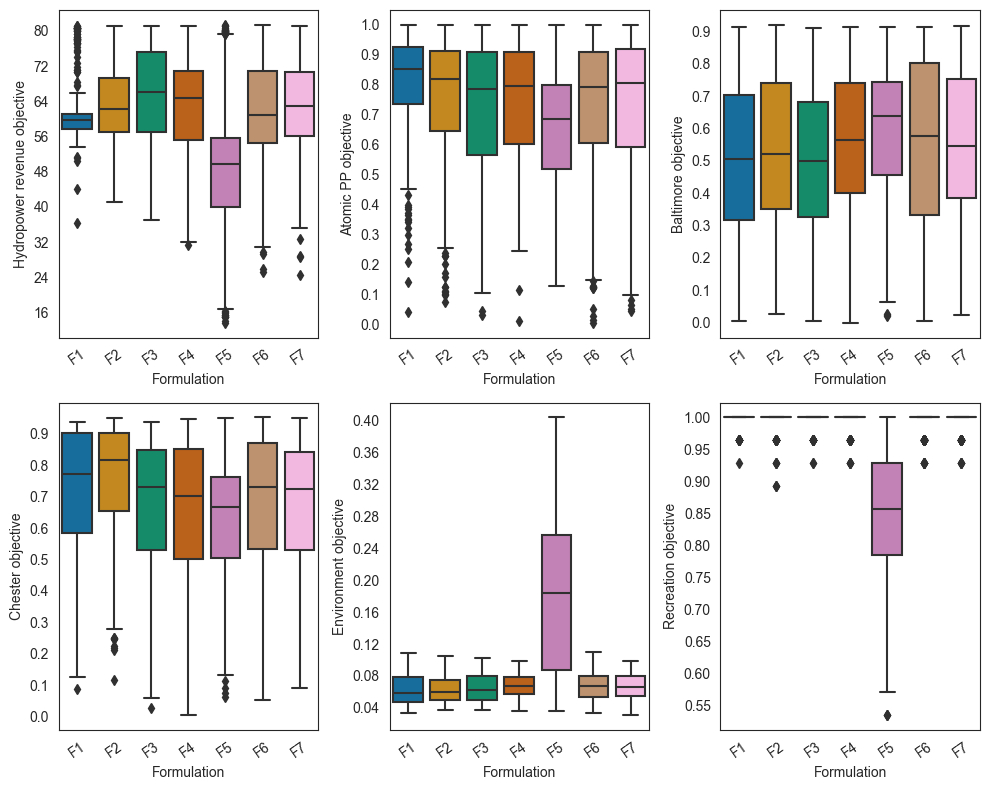

In [768]:
ethical_formulations_experiment_name = ['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7']
l = []
for n in ethical_formulations_experiment_name:
    l.append(n)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 8))

for i, entry in enumerate(combined_obj_inequality_metrics.columns[0:6]):
    data = combined_obj_inequality_metrics[[entry, 'Formulation']]
    ax = axes[i // 3, i % 3]
    sns.boxplot(data=data, y=entry, x='Formulation', order=l, palette='colorblind', ax=ax)
    ax.set_ylabel(f"{entry} objective")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=35) 
    
    # Increase the number of y ticks
    ax.yaxis.set_major_locator(plt.MaxNLocator(12))
plt.tight_layout()
plt.savefig(f'figs/boxplot_analysis_objectives.png', dpi=300, bbox_inches='tight')
plt.show()


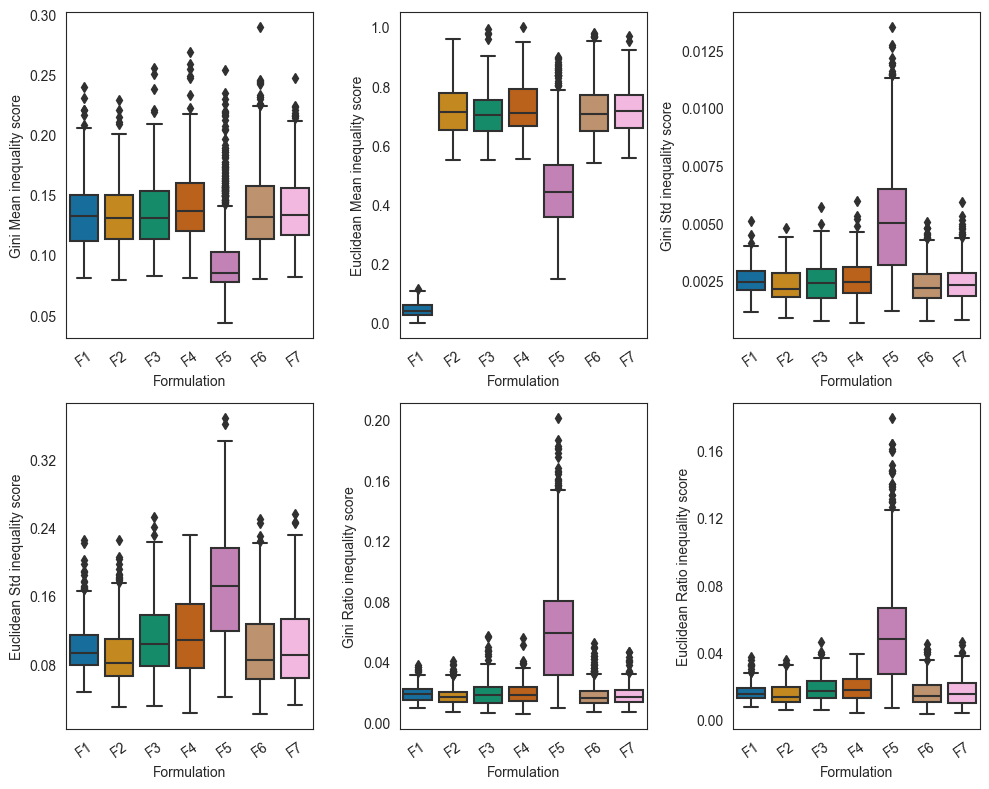

In [769]:

ethical_formulations_experiment_name = ['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7',]
l = []
for n in ethical_formulations_experiment_name:
    l.append(n)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 8))

for i, entry in enumerate(combined_obj_inequality_metrics.columns[6:-1]):
    data = combined_obj_inequality_metrics[[entry, 'Formulation']]
    ax = axes[i // 3, i % 3]
    sns.boxplot(data=data, y=entry, x='Formulation', order=l, palette='colorblind', ax=ax)
    ax.set_ylabel(f"{entry} inequality score")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=35)
    ax.yaxis.set_major_locator(plt.MaxNLocator(6))

plt.tight_layout()
plt.savefig(f'figs/boxplot_analysis_justice_principles.png', dpi=300, bbox_inches='tight')
plt.show()


In this Section we will discuss everything in relative terms without looking at the values of justice, because the values are merely a measure of relative distance. Hence, what it means to achieve a certain equity value is not representative to an exact degree of justice. The metric values gain relevance when they are compared to each other. To make this possible, while the optimization was ran for a specific distributive justice formulation such as the Gini Mean complementing the Traditional Formulation, for each solution found the other metrics were calculated as well, without optimizing over them. Hence, it becomes possible to compare what degree of justice has been achieved according to one specific formulation, over other formulations. This brings light to differences between justice values achieved across inequality metric and across aggregation method.

One should recall that I want to minimize the justice value. Hence the distribution closest to 0 is desired.

**Gini Mean inequality score:**
According to the Gini Mean, there is no difference in justice achieved between the Traditional Formulation, and the Gini Mean, and Gini Deviation. The Gini Ratio will lead to higher inequality. The Euclidean Mean is the formulation reaching lower inequality. This is also what is seen at the Parallel Axes Plot. For other formulations, it is unclear why the Traditional Formulation has a similar distribution for this inequality score. Especially, when I observe the median of solutions, this indicates that the trade-offs are substantially weaker compared to the Traditional Formulation. 

**Euclidean Mean formulation inequality score:**
Previously I determined that the Gini Mean and Euclidean Mean best represent when a solution is just due to the horizontal line across objectives observed aligning with a higher justice value in its formulation. Since the Euclidean Mean is normalized to its own solution range space it is most suitable to show the ranges achieved across solutions.

According to the Euclidean Mean, the different formulations will lead to similar justice values. It is interesting to note that the justice achieved by the Traditional Formulation again is similar to the formulations where distributive justice is being optimized. When zooming into relative differences, while the Gini Mean indicated that the Gini Deviation led to a slighly higher IQ range, for this inequality score, the Gini Deviation seems to indicate a lower IQ range. Thus, there is a difference in justice across inequality metric used for optimization. 

Moreover, only the Euclidean Mean reaches lower justice values. This was also seen in the Parallel Axes Plot analysis. However, this will be at the cost of efficiency as observed from the distribution for the different objectives. 

**Gini Deviation, Gini Ratio, Euclidean Deviation, Euclidean Ratio inequality score:**
Both inequality scores indicate the same. While the Euclidean Mean achieved more justice when I look at the yearly mean objectives, across months, the Euclidean Mean is responsible for a higher inequality. This is an interesting finding, which would indicate that there is a trade-off to be made between justice across time (disaggregated) and justice over the entire time span (aggregated). 

Furthermore, when I look at the differences across formulations, there are small changes in inequality compared to the Traditional Formulation. For this, I use the Euclidean Deviation as inequality score since it best represents the differences. In contrast to the Euclidean Mean, the Gini Mean lowers the IQ range compared to the Traditional Formulation. The Euclidean Deviation, and Euclidean Ratio lower the median similarly to the Gini Mean. Conversely, the Gini Deviation and Gini Ratio bring the IQ range up (with the median). This indicates that the penalizing effect for relative distances across months is weak such that it the behaviour for distributive justice relative to the traditional maximization is not dominant in the optimization..


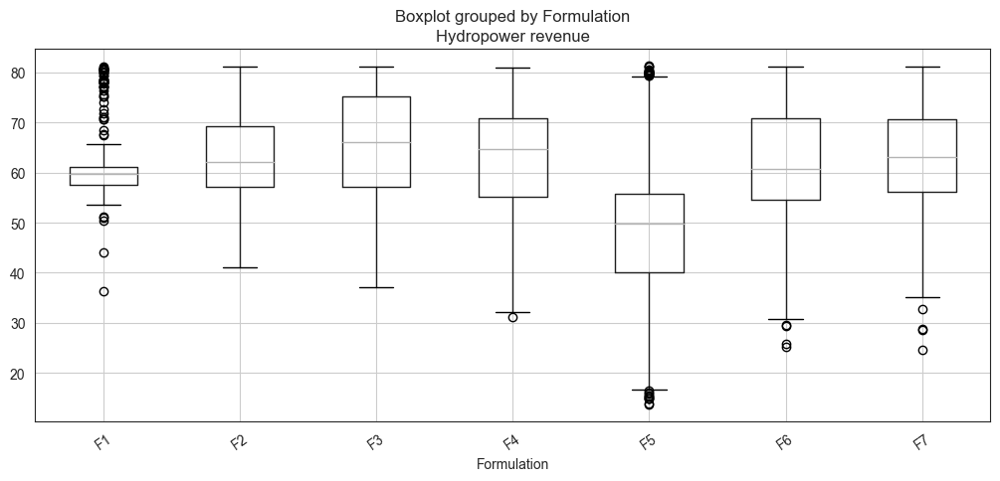

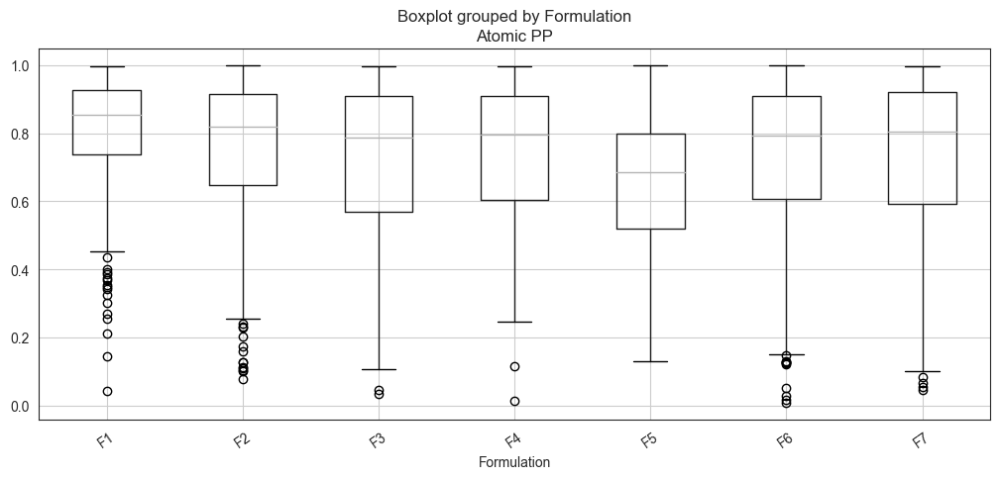

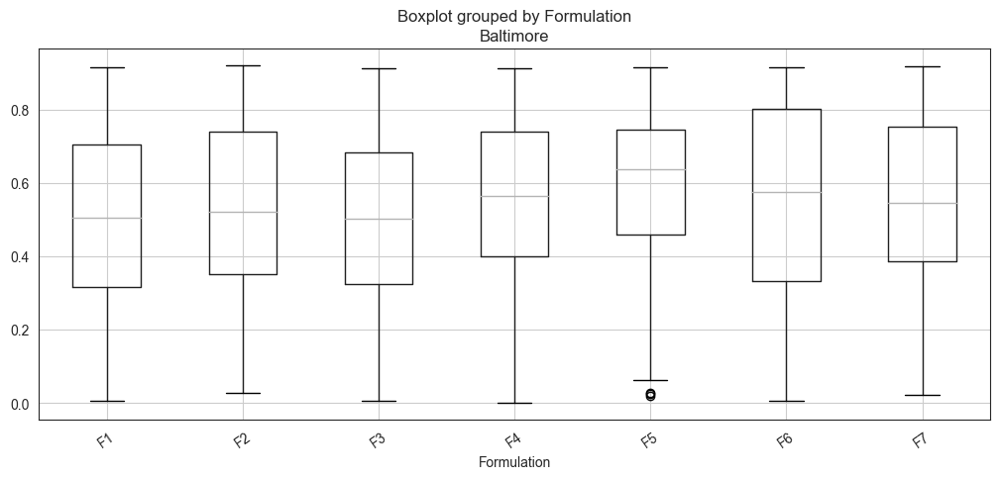

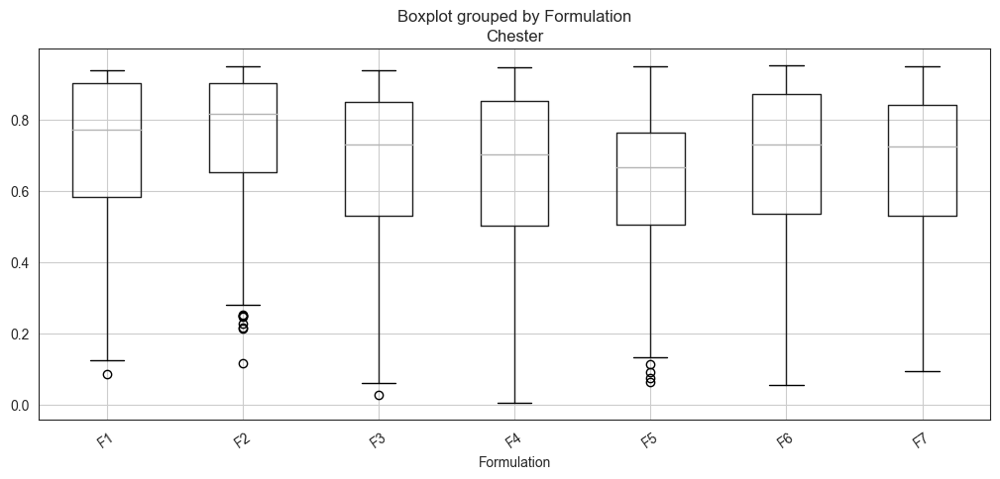

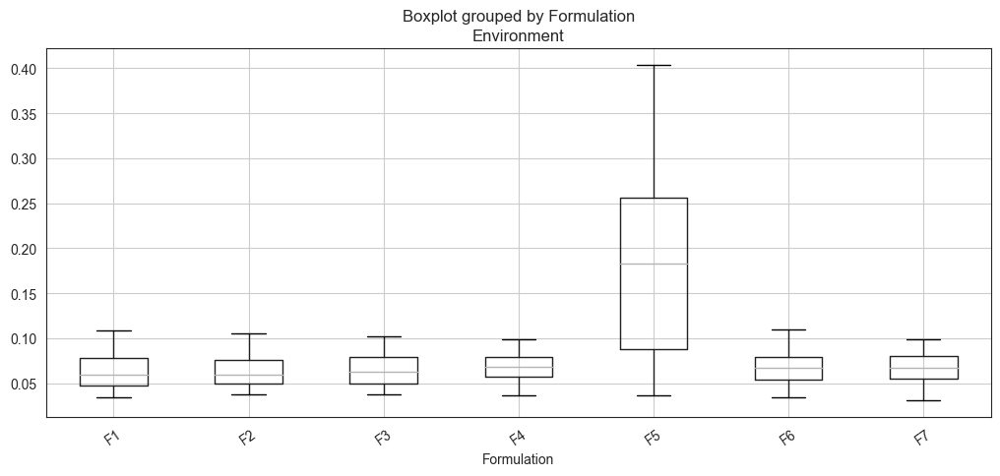

...

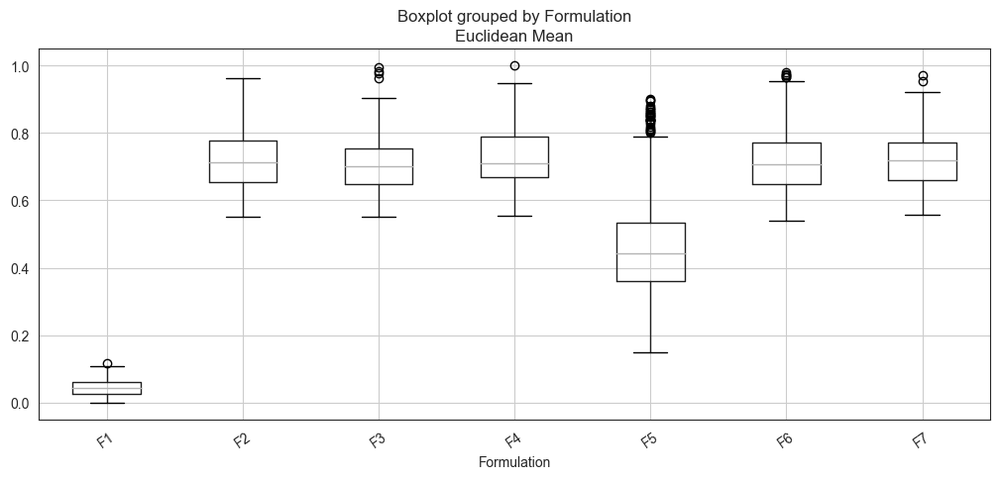

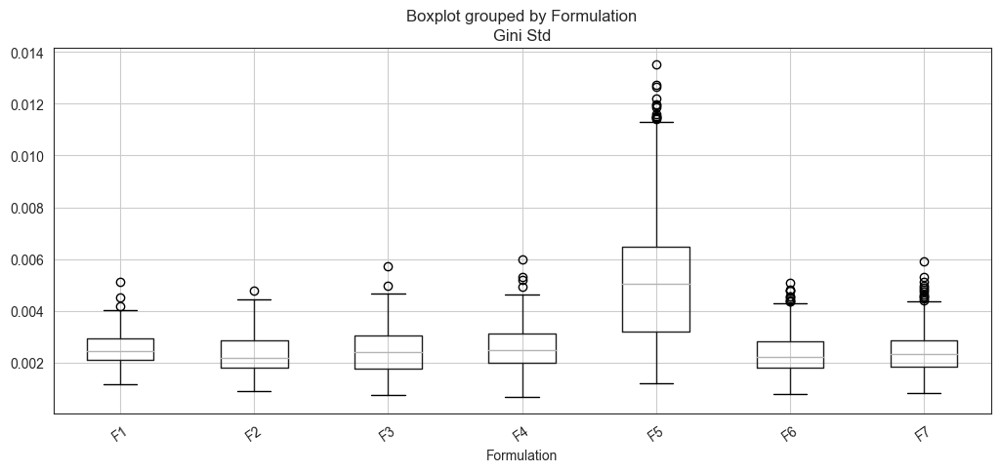

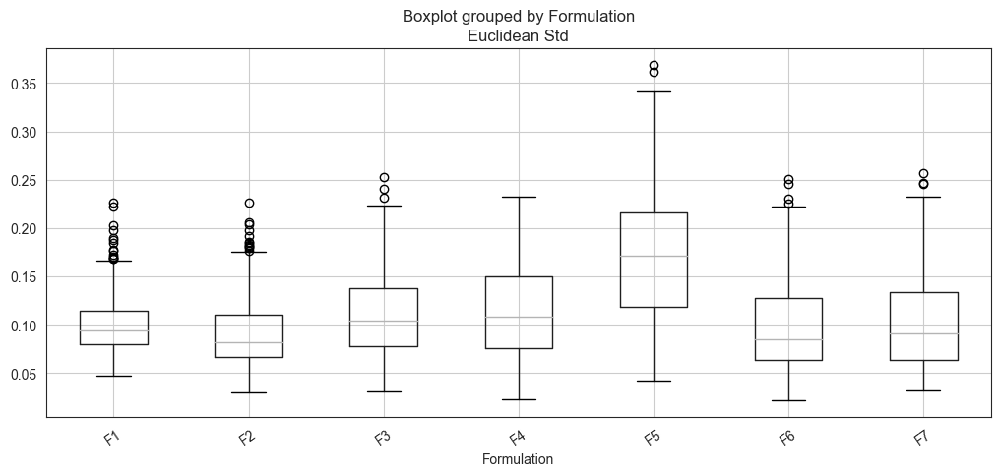

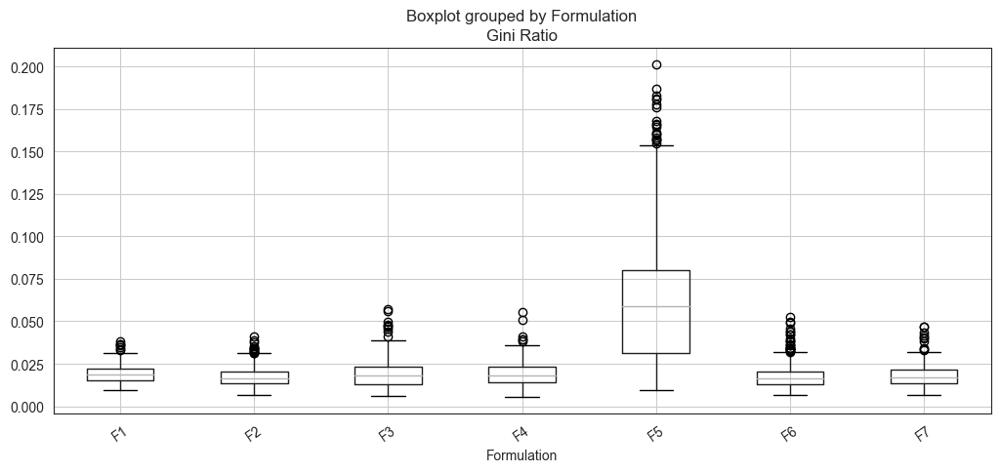

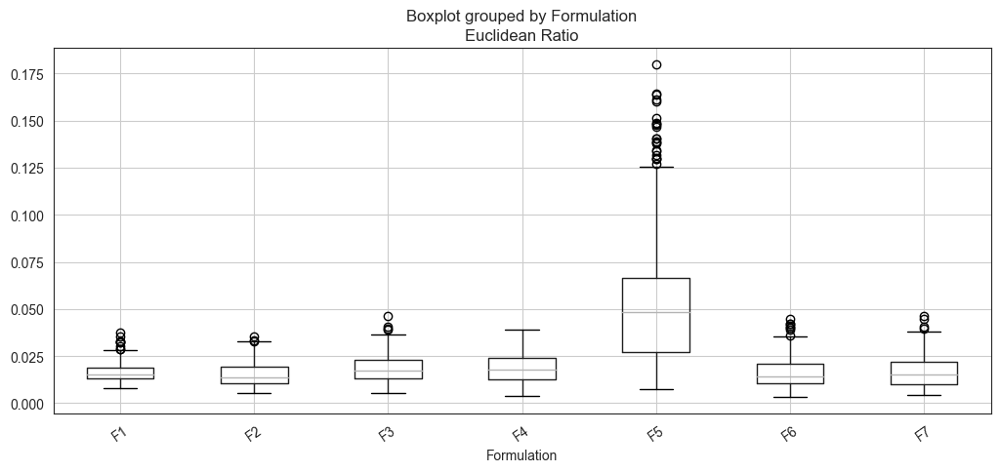

In [764]:
for entry in combined_obj_inequality_metrics.columns[0:-1]:
    combined_obj_inequality_metrics.boxplot(column=entry, by='Formulation', rot=35)
    plt.savefig(f'figs/{entry}_boxplot.jpg', dpi=300)
plt.show()

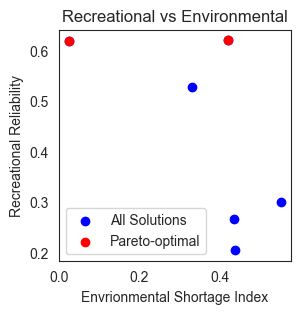

In [798]:

plt.rcParams['figure.figsize'] = [3, 3]


# Generate random numbers
np.random.seed(2)  # Set seed for reproducibility
x = np.random.uniform(0, 1, 6)
y = np.random.uniform(0, 1, 6)

# Find the index of the point with the smallest x and largest y
# Initialize a list to store the indices of Pareto-optimal solutions
pareto_indices = []

# Check dominance for each solution
for i in range(len(x)):
    is_pareto = True
    for j in range(len(x)):
        if x[j] <= x[i] and y[j] >= y[i] and (x[j] < x[i] or y[j] > y[i]):
            is_pareto = False
            break
    if is_pareto:
        pareto_indices.append(i)

# Plot the scatter plot
plt.scatter(x, y, color='blue', label='All Solutions')

# Plot the Pareto-optimal solutions
pareto_x = [x[i] for i in pareto_indices]
pareto_y = [y[i] for i in pareto_indices]
plt.scatter(pareto_x, pareto_y, color='red', label='Pareto-optimal')

# Add labels and title
plt.xlabel('Envrionmental Shortage Index')
plt.ylabel('Recreational Reliability')
plt.title('Recreational vs Environmental')

# Display the plot
plt.savefig('figs/example_scatter_plot.png',dpi=300)

plt.legend()
plt.show()


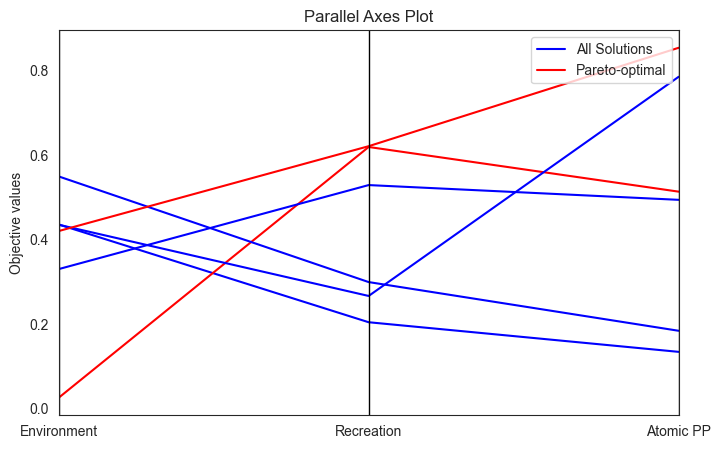

In [806]:
from pandas.plotting import parallel_coordinates

np.random.seed(2)  # Set seed for reproducibility
x = np.random.uniform(0, 1, 6)
y = np.random.uniform(0, 1, 6)
z = np.random.uniform(0, 1, 6)

# Find the index of the point with the smallest x and largest y
# Initialize a list to store the indices of Pareto-optimal solutions
pareto_indices = []

# Check dominance for each solution
for i in range(len(x)):
    is_pareto = True
    for j in range(len(x)):
        if x[j] <= x[i] and y[j] >= y[i] and (x[j] < x[i] or y[j] > y[i]):
            is_pareto = False
            break
    if is_pareto:
        pareto_indices.append(i)

# Create a dataframe with x, y, and z
data = {'X': x, 'Y': y, 'Z': z}
df = pd.DataFrame(data)
# Generate random numbers
np.random.seed(2)  # Set seed for reproducibility
x = np.random.uniform(0, 1, 6)
y = np.random.uniform(0, 1, 6)
z = np.random.uniform(0, 1, 6)

# Find the index of the point with the smallest x and largest y
# Initialize a list to store the indices of Pareto-optimal solutions
pareto_indices = []

# Check dominance for each solution
for i in range(len(x)):
    is_pareto = True
    for j in range(len(x)):
        if x[j] <= x[i] and y[j] >= y[i] and (x[j] < x[i] or y[j] > y[i]):
            is_pareto = False
            break
    if is_pareto:
        pareto_indices.append(i)

# Create a dataframe with x, y, and z
data = {'Environment': x, 'Recreation': y, 'Atomic PP': z, 'Pareto': ['Pareto-optimal' if i in pareto_indices else 'All Solutions' for i in range(len(x))]}
df = pd.DataFrame(data)

# Plot the parallel axes plot
plt.rcParams['figure.figsize'] = [8, 5]  # Adjust figure size if needed
parallel_coordinates(df, 'Pareto', color=['blue', 'red'])

# Add labels and title
# plt.xlabel('Variables')
plt.ylabel('Objective values')
plt.title('Parallel Axes Plot')
plt.grid(False)
plt.savefig('figs/example_parallel_axes_plot.png',dpi=300)


# Display the plot
plt.show()
